# Time Series Analysis on Uber dataset

In [1]:
from __future__ import print_function
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
import random
import itertools
from scipy.stats import norm
from datetime import datetime
import requests
from io import BytesIO
plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')
import json
from pprint import pprint
%matplotlib inline
from matplotlib.pylab import plt
%pylab inline
pylab.rcParams['figure.figsize']=(25, 8)
from statsmodels.tsa import stattools
from pandas.tools.plotting import autocorrelation_plot

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Populating the interactive namespace from numpy and matplotlib


In [2]:
uber = pd.read_json('uber.json')
uber.head()

,Date-time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
0,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
1,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
3,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
4,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56


In [3]:
#checking for null values
uber.isnull()

,Date-time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,True,False,False,False,False,False,False,True,False,True,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [4]:
#displaying unique values under display_name column
uber.display_name.unique()

array(['uberPOOL', 'uberX', 'uberSUV', 'uberXL', 'UberBLACK', 'uberWAV',
       'TAXI'], dtype=object)

In [5]:
#removing TAXI since it has null values and is not related to predicting uber prices in any way because it is metered
#just like a regular taxi
uber = uber[uber.display_name != 'TAXI']

In [6]:
uber.head(n = 10)

,Date-time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
0,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
1,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
3,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
4,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56
5,2017-12-05 22:47:56,USD,uberWAV,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberWAV,18.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:47:56
7,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
8,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
9,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
10,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56


In [7]:
uber = uber.rename(columns = {'Date-time':'date_time'})
#looking at datatypes
uber.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43896 entries, 0 to 51210
Data columns (total 15 columns):
date_time                 43896 non-null object
currency_code             43896 non-null object
display_name              43896 non-null object
distance                  43896 non-null float64
duration                  43896 non-null int64
end_latitude              43896 non-null float64
end_longitude             43896 non-null float64
estimate                  43896 non-null object
high_estimate             43896 non-null float64
localized_display_name    43896 non-null object
low_estimate              43896 non-null float64
product_id                43896 non-null object
start_latitude            43896 non-null float64
start_longitude           43896 non-null float64
time                      43896 non-null object
dtypes: float64(7), int64(1), object(7)
memory usage: 5.4+ MB


In [8]:
#changing datatype of column date_time from object to datetime
uber['date_time'] = pd.to_datetime(uber['date_time'])
uber.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43896 entries, 0 to 51210
Data columns (total 15 columns):
date_time                 43896 non-null datetime64[ns]
currency_code             43896 non-null object
display_name              43896 non-null object
distance                  43896 non-null float64
duration                  43896 non-null int64
end_latitude              43896 non-null float64
end_longitude             43896 non-null float64
estimate                  43896 non-null object
high_estimate             43896 non-null float64
localized_display_name    43896 non-null object
low_estimate              43896 non-null float64
product_id                43896 non-null object
start_latitude            43896 non-null float64
start_longitude           43896 non-null float64
time                      43896 non-null object
dtypes: datetime64[ns](1), float64(7), int64(1), object(6)
memory usage: 5.4+ MB


In [9]:
uber.groupby('display_name').high_estimate.mean()

display_name
UberBLACK    40.107436
uberPOOL     16.630946
uberSUV      51.318207
uberWAV      19.000273
uberX        19.000000
uberXL       29.998086
Name: high_estimate, dtype: float64

In [10]:
uber.groupby('display_name').high_estimate.max()

display_name
UberBLACK    174.0
uberPOOL      62.0
uberSUV      207.0
uberWAV       64.0
uberX         64.0
uberXL       100.0
Name: high_estimate, dtype: float64

In [11]:
uber.groupby('display_name').high_estimate.min()

display_name
UberBLACK    17.0
uberPOOL      7.0
uberSUV      25.0
uberWAV       8.0
uberX         8.0
uberXL       13.0
Name: high_estimate, dtype: float64

In [12]:
uber.groupby('display_name').low_estimate.mean()

display_name
UberBLACK    31.916621
uberPOOL     11.885730
uberSUV      41.080645
uberWAV      14.648989
uberX        14.648715
uberXL       23.628759
Name: low_estimate, dtype: float64

In [13]:
uber.groupby('display_name').low_estimate.max()

display_name
UberBLACK    142.0
uberPOOL      49.0
uberSUV      168.0
uberWAV       52.0
uberX         52.0
uberXL        81.0
Name: low_estimate, dtype: float64

In [14]:
uber.groupby('display_name').low_estimate.min()

display_name
UberBLACK    13.0
uberPOOL      4.0
uberSUV      20.0
uberWAV       6.0
uberX         6.0
uberXL        9.0
Name: low_estimate, dtype: float64

In [15]:
uber.corr()

,distance,duration,end_latitude,end_longitude,high_estimate,low_estimate,start_latitude,start_longitude
distance,1.000000e+00,7.012413e-01,-5.720545e-02,4.488740e-01,5.549195e-01,5.508530e-01,-8.348031e-14,-8.425528e-14
duration,7.012413e-01,1.000000e+00,-2.371489e-01,2.910054e-01,4.412757e-01,4.378919e-01,1.602412e-14,-2.218263e-15
end_latitude,-5.720545e-02,-2.371489e-01,1.000000e+00,5.564418e-01,-3.842208e-02,-3.784188e-02,3.568500e-11,3.567926e-11
end_longitude,4.488740e-01,2.910054e-01,5.564418e-01,1.000000e+00,2.509698e-01,2.494468e-01,4.704679e-10,4.704649e-10
high_estimate,5.549195e-01,4.412757e-01,-3.842208e-02,2.509698e-01,1.000000e+00,9.994293e-01,7.117708e-16,-5.120946e-15
low_estimate,5.508530e-01,4.378919e-01,-3.784188e-02,2.494468e-01,9.994293e-01,1.000000e+00,-6.917791e-15,6.122552e-15
start_latitude,-8.348031e-14,1.602412e-14,3.568500e-11,4.704679e-10,7.117708e-16,-6.917791e-15,1.000000e+00,1.000000e+00
start_longitude,-8.425528e-14,-2.218263e-15,3.567926e-11,4.704649e-10,-5.120946e-15,6.122552e-15,1.000000e+00,1.000000e+00


In [16]:
uber.tail()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
51206,2017-12-13 15:39:19,USD,uberX,3.2,900,42.322207,-71.17031,$15-19,19.0,uberX,15.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,15:39:19
51207,2017-12-13 15:39:19,USD,uberSUV,3.2,900,42.322207,-71.17031,$33-41,41.0,uberSUV,33.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,15:39:19
51208,2017-12-13 15:39:19,USD,uberXL,3.2,900,42.322207,-71.17031,$25-31,31.0,uberXL,25.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,15:39:19
51209,2017-12-13 15:39:19,USD,UberBLACK,3.2,900,42.322207,-71.17031,$24-30,30.0,UberBLACK,24.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,15:39:19
51210,2017-12-13 15:39:19,USD,uberWAV,3.2,900,42.322207,-71.17031,$15-19,19.0,uberWAV,15.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,15:39:19


In [17]:
uber.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
0,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
1,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
3,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
4,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56


In [18]:
#set the index to datetimeindex
uber = uber.set_index(pd.DatetimeIndex(uber['date_time']))
uber.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:47:56,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
2017-12-05 22:47:56,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2017-12-05 22:47:56,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
2017-12-05 22:47:56,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
2017-12-05 22:47:56,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56


In [19]:
#let's round the datetimeindex to the minute so it looks cleaner
uber = uber.set_index(pd.DatetimeIndex(uber['date_time']).round('T'))
uber.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56


# uberPOOL

In [20]:
#here we will separate the 6 different types of uber services into their own dataframes
uberPOOL = uber[uber.display_name == 'uberPOOL']
uberPOOL.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberPOOL,8.24,1080,42.314857,-71.056782,$8-11,12.0,uberPOOL,8.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberPOOL,6.18,1140,42.272678,-71.093765,$6-9,10.0,uberPOOL,6.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberPOOL,6.18,1140,42.272678,-71.093765,$6-9,10.0,uberPOOL,6.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,uberPOOL,8.53,1320,42.247948,-71.173050,$10-14,15.0,uberPOOL,10.0,997acbb5-e102-41e1-b155-9df7de0a73f2,42.342588,-71.122463,22:51:50


In [21]:
#now that we're done splitting them into different dataframes, let's start with uberPOOL and its high estimates
uberPOOL_col_list = ['high_estimate', 'low_estimate']
uberPOOL_he = uberPOOL[uberPOOL_col_list]
uberPOOL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:52:00,15.0,10.0


In [22]:
#remove duplicated datetimeindex
uberPOOL_he = uberPOOL_he[~uberPOOL_he.index.duplicated(keep = 'first')]
uberPOOL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:52:00,15.0,10.0
2017-12-05 22:55:00,8.0,5.0
2017-12-05 22:58:00,11.0,7.0


In [23]:
print(min(uberPOOL_he.index))
print(max(uberPOOL_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


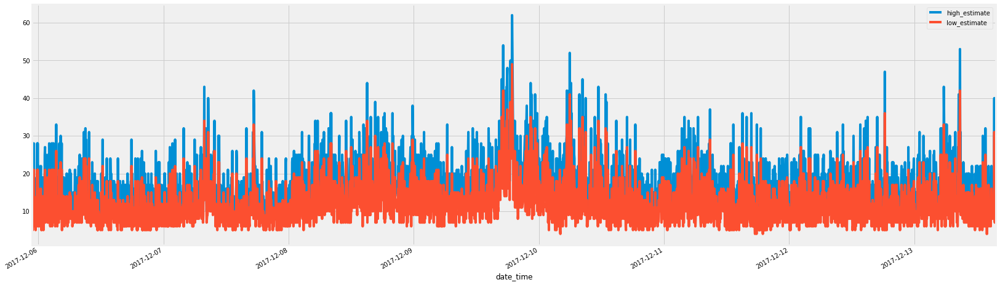

In [24]:
uberPOOL_he.plot()

In [25]:
#here we can see that there is a spike around the 9th and 10th because it was snowing that day!

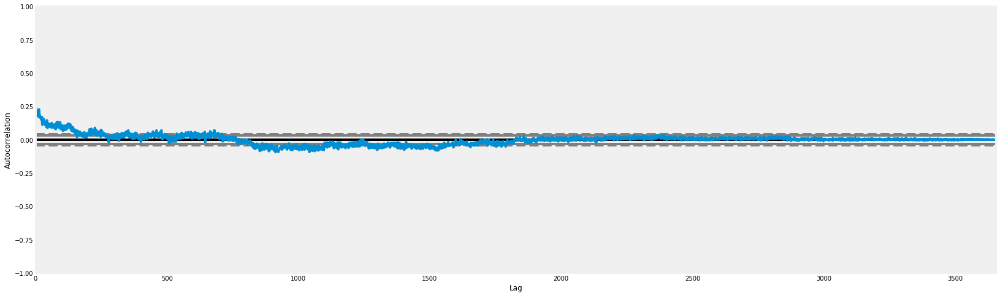

In [26]:
#checking randomness in the uberPOOL dataframe
autocorrelation_plot(uberPOOL_he['high_estimate'])

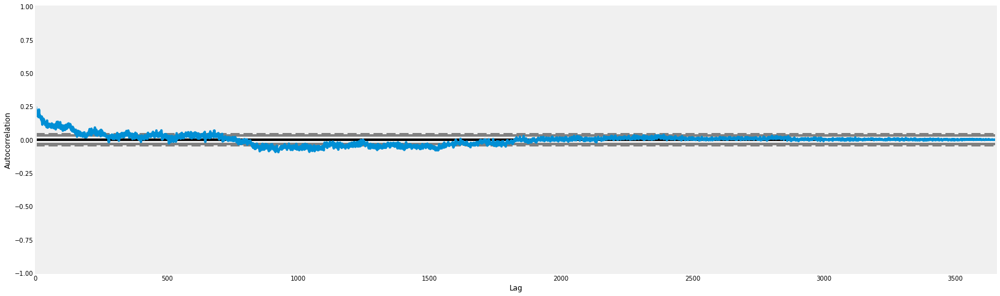

In [27]:
autocorrelation_plot(uberPOOL_he['low_estimate'])

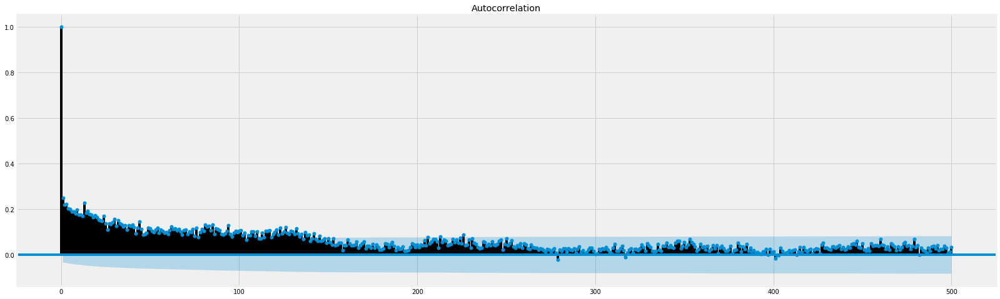

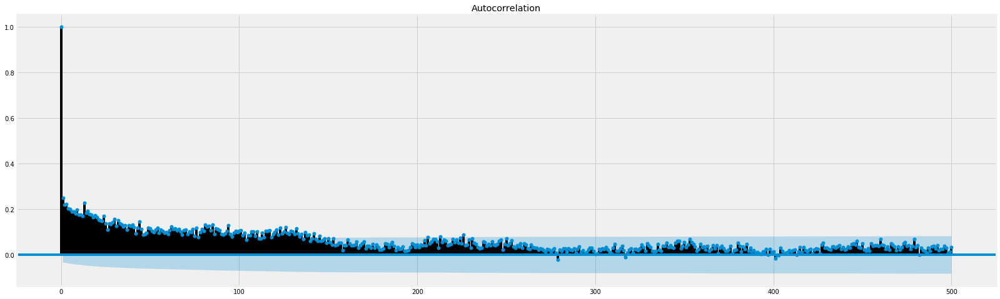

In [28]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(uberPOOL_he['high_estimate'], lags=500)

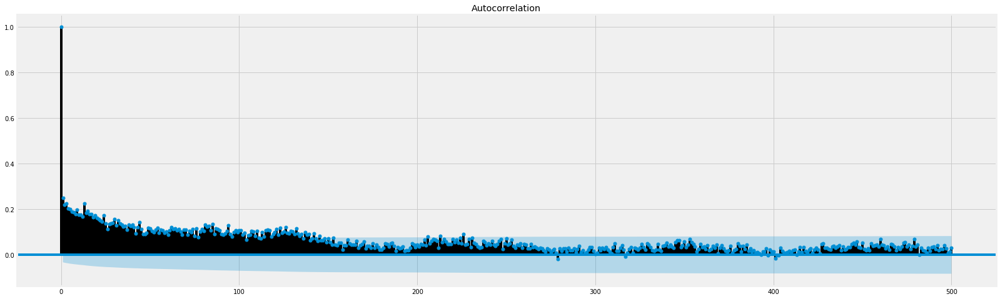

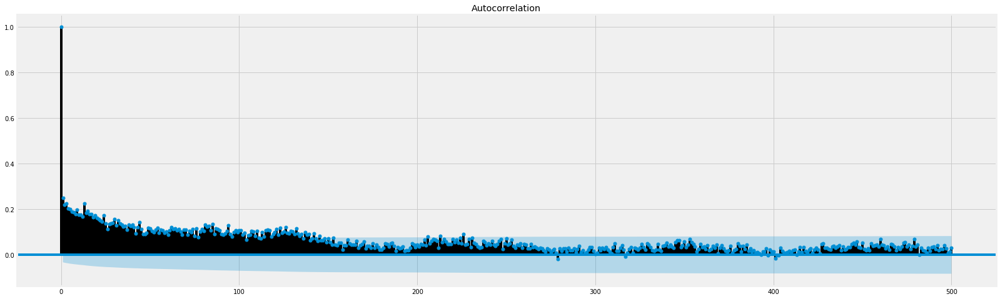

In [29]:
plot_acf(uberPOOL_he['low_estimate'], lags=500)

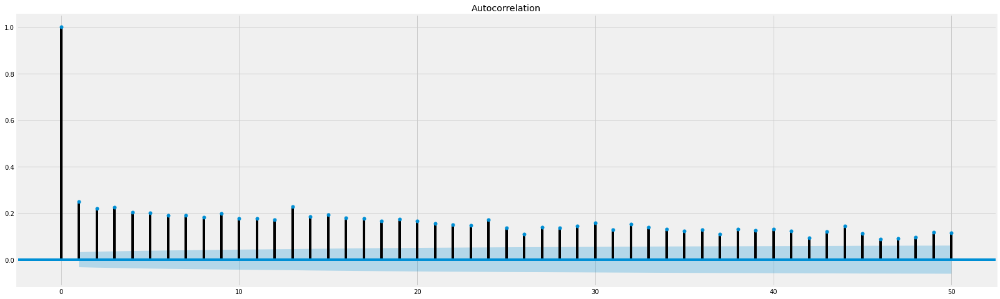

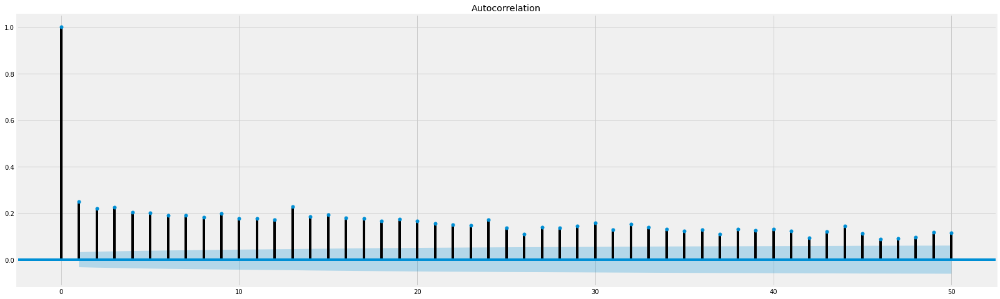

In [30]:
plot_acf(uberPOOL_he['high_estimate'], lags=50)

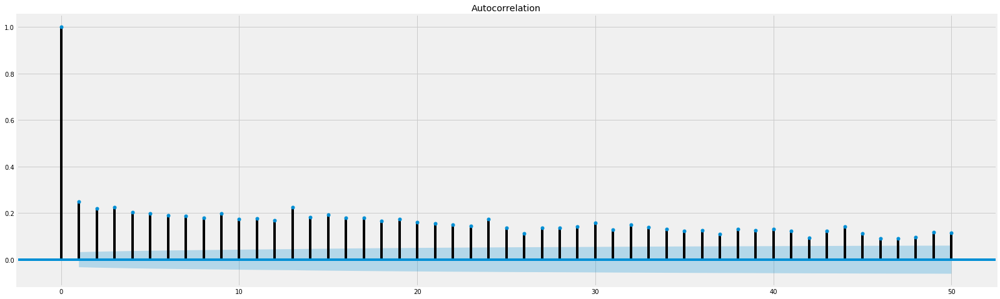

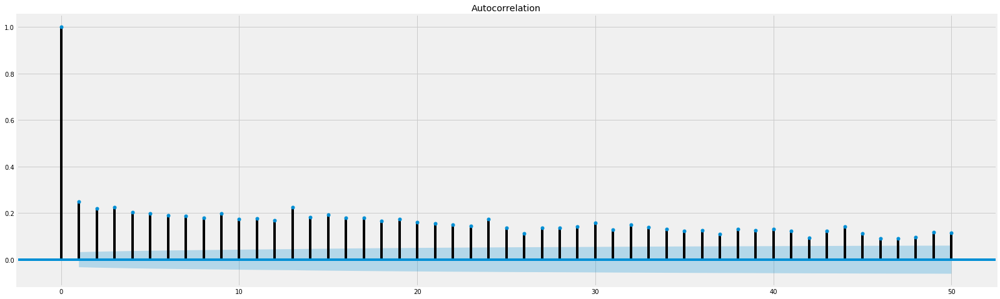

In [31]:
plot_acf(uberPOOL_he['low_estimate'], lags=50)

In [32]:
#resampling to hourly
uberPOOL_he = uberPOOL_he.resample('H').mean()

In [33]:
uberPOOL_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [34]:
uberPOOL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,11.20,7.20
2017-12-05 23:00:00,15.10,10.65
2017-12-06 00:00:00,14.45,10.20
2017-12-06 01:00:00,16.55,11.95
2017-12-06 02:00:00,16.20,11.55


In [35]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [36]:
mod = sm.tsa.ARIMA(uberPOOL_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:971.1444009475722


In [37]:
mod = sm.tsa.ARIMA(uberPOOL_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:896.5732989977512


In [38]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberPOOL_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:971.1444009475722
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:896.0630802828
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:887.7466564670405
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:871.9712011101353
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:862.1869378169938
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:863.6426814086828
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:882.7017582375412
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:857.4555126929428


In [39]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberPOOL_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:896.5732989977512
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:820.575908536
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:812.7412705870195
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:797.3524721339707
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:787.0770556072421
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:788.6055479652726
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:807.9638580366125
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:782.6631533902821


In [40]:
uberPOOL_he['ln_high_estimate'] = np.log(uberPOOL_he['high_estimate'])
uberPOOL_he['D.ln_high_estimate'] = uberPOOL_he['ln_high_estimate'].diff()

In [41]:
uberPOOL_he['ln_low_estimate'] = np.log(uberPOOL_he['low_estimate'])
uberPOOL_he['D.ln_low_estimate'] = uberPOOL_he['ln_low_estimate'].diff()

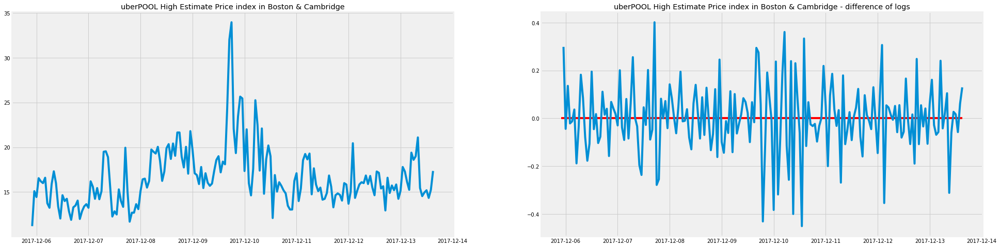

In [42]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberPOOL_he.index._mpl_repr(), uberPOOL_he['high_estimate'], '-')
axes[0].set(title='uberPOOL High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberPOOL_he.index._mpl_repr(), uberPOOL_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, uberPOOL_he.index[0], uberPOOL_he.index[-1], 'r')
axes[1].set(title='uberPOOL High Estimate Price index in Boston & Cambridge - difference of logs');

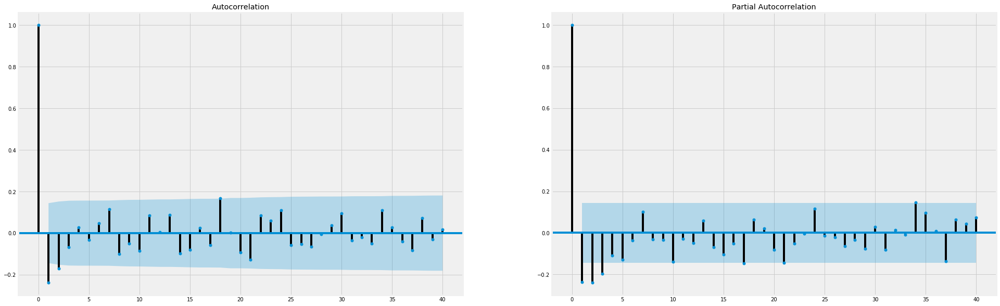

In [43]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberPOOL_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberPOOL_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

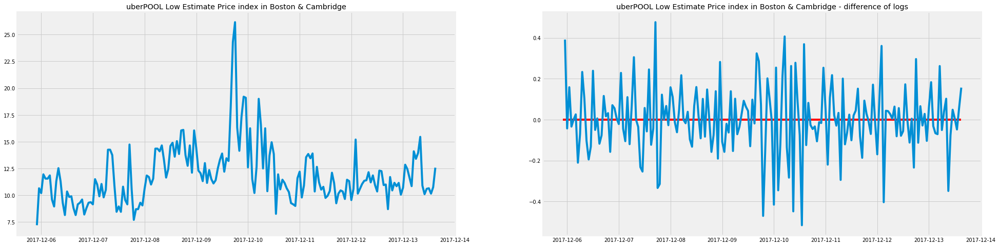

In [44]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberPOOL_he.index._mpl_repr(), uberPOOL_he['low_estimate'], '-')
axes[0].set(title='uberPOOL Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberPOOL_he.index._mpl_repr(), uberPOOL_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, uberPOOL_he.index[0], uberPOOL_he.index[-1], 'r')
axes[1].set(title='uberPOOL Low Estimate Price index in Boston & Cambridge - difference of logs');

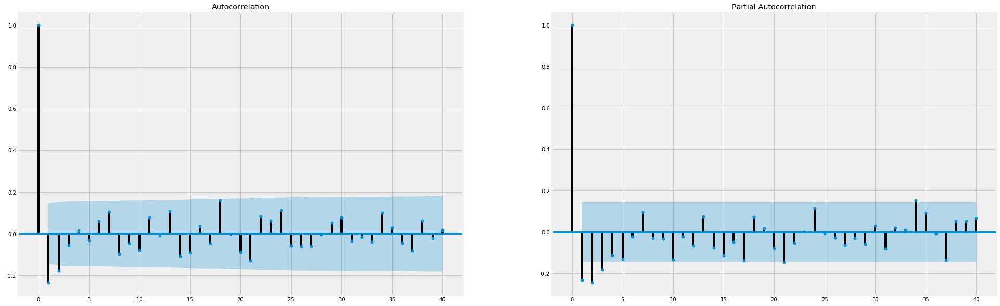

In [45]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberPOOL_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberPOOL_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [46]:
mod = sm.tsa.statespace.SARIMAX(uberPOOL_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 108.559
Date:                Sat, 16 Dec 2017   AIC                           -209.119
Time:                        01:55:04   BIC                           -196.216
Sample:                    12-05-2017   HQIC                          -203.890
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0002      0.000      0.705      0.481      -0.000       0.001
ar.L1          0.6353      0.055     11.562      0.000       0.528       0.743
ma.L1         -0.9862      0.016    -62.580      0.000      -1.017      -0.955
sigma2         0.0179      0.002     11.033      0.000       0.015       0.021
===================================================================================
Ljung-Box (Q):                       46.98   Jarque-Bera (JB):                 3.93
Prob(Q):                              0.21   Prob(JB):                         0.14
Heteroskedasticity (H):               0.79   Skew:                             0.16
Prob(H) (two-sided):                  0.36   Kurtosis:                         3.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [47]:
mod = sm.tsa.statespace.SARIMAX(uberPOOL_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  85.155
Date:                Sat, 16 Dec 2017   AIC                           -162.309
Time:                        01:55:04   BIC                           -149.406
Sample:                    12-05-2017   HQIC                          -157.080
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0003      0.000      0.657      0.511      -0.001       0.001
ar.L1          0.6226      0.060     10.369      0.000       0.505       0.740
ma.L1         -0.9717      0.016    -60.205      0.000      -1.003      -0.940
sigma2         0.0231      0.002     11.110      0.000       0.019       0.027
===================================================================================
Ljung-Box (Q):                       43.10   Jarque-Bera (JB):                 3.74
Prob(Q):                              0.34   Prob(JB):                         0.15
Heteroskedasticity (H):               0.72   Skew:                             0.08
Prob(H) (two-sided):                  0.21   Kurtosis:                         3.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [48]:
# Variables
endog = uberPOOL_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(uberPOOL_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -320.818
Date:                Sat, 16 Dec 2017   AIC                            651.637
Time:                        01:55:04   BIC                            667.712
Sample:                    12-06-2017   HQIC                           658.152
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 16.6271      0.657     25.289      0.000      15.338      17.916
D.ln_high_estimate     8.4803      0.246     34.431      0.000       7.998       8.963
ar.L1                  0.6555      0.038     17.285      0.000       0.581       0.730
ma.L1                  0.7894      0.049     16.194      0.000       0.694       0.885
sigma2                 1.8898      0.144     13.136      0.000       1.608       2.172
===================================================================================
Ljung-Box (Q):                       47.94   Jarque-Bera (JB):               134.02
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             1.06
Prob(H) (two-sided):                  0.37   Kurtosis:                         6.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

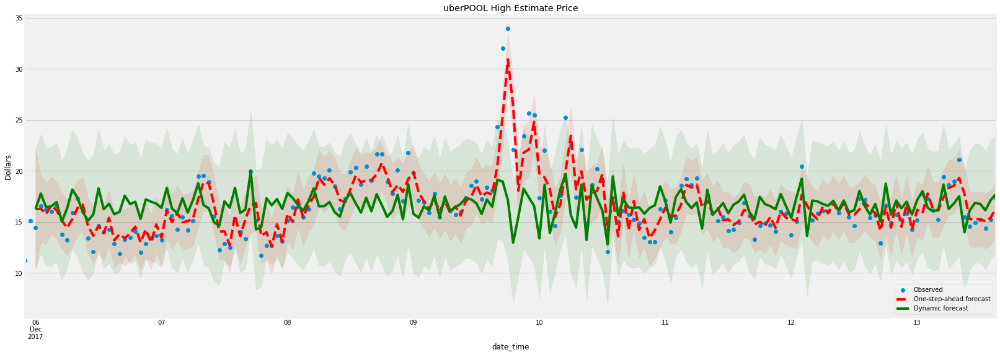

In [49]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberPOOL High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberPOOL_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

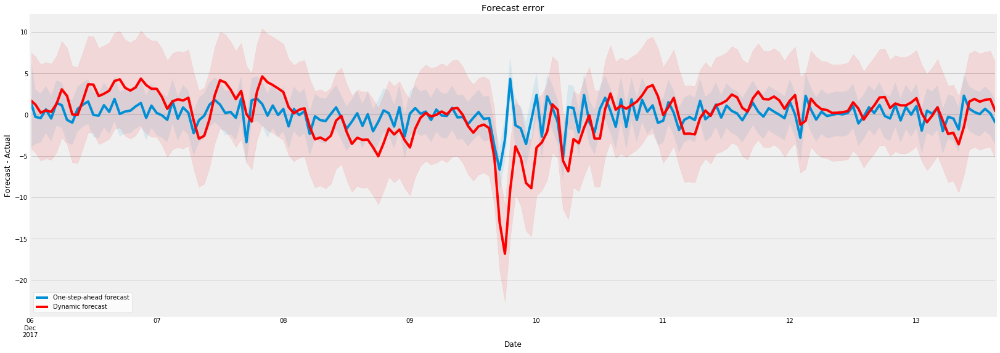

In [50]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [51]:
# Variables
endog = uberPOOL_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(uberPOOL_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -288.090
Date:                Sat, 16 Dec 2017   AIC                            586.180
Time:                        01:55:05   BIC                            602.255
Sample:                    12-06-2017   HQIC                           592.695
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                11.8821      0.541     21.968      0.000      10.822      12.942
D.ln_low_estimate     6.1036      0.198     30.836      0.000       5.716       6.491
ar.L1                 0.6569      0.037     17.804      0.000       0.585       0.729
ma.L1                 0.7443      0.051     14.517      0.000       0.644       0.845
sigma2                1.3254      0.101     13.145      0.000       1.128       1.523
===================================================================================
Ljung-Box (Q):                       48.01   Jarque-Bera (JB):               130.78
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                             1.04
Prob(H) (two-sided):                  0.26   Kurtosis:                         6.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

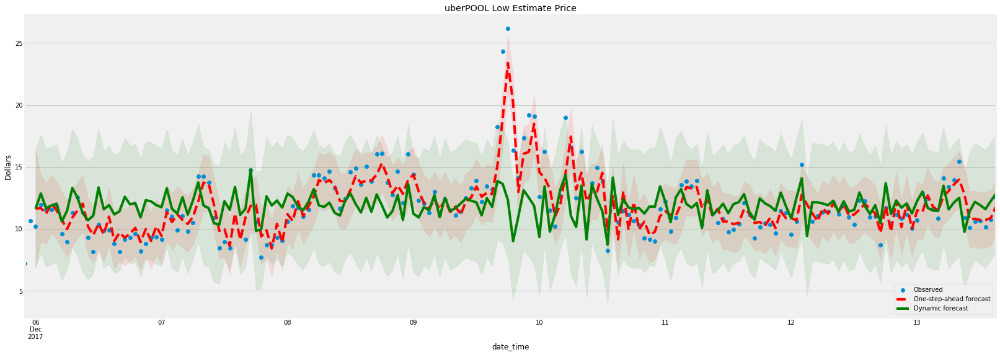

In [52]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberPOOL Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberPOOL_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

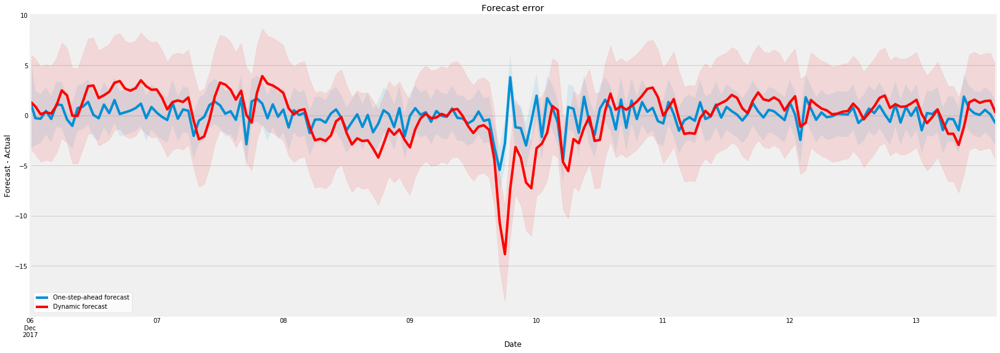

In [53]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

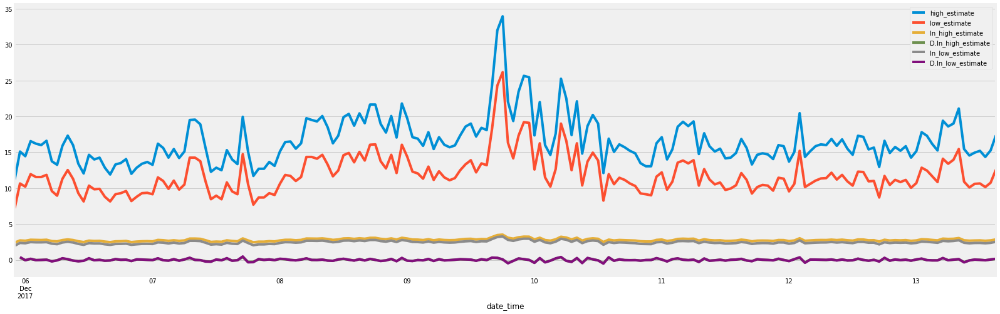

In [54]:
uberPOOL_he.plot()

# uberX

In [55]:
uberX = uber[uber.display_name == 'uberX']
uberX.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberX,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberX,18.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberX,6.18,1140,42.272678,-71.093765,$15-19,19.0,uberX,15.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberX,6.18,1140,42.272678,-71.093765,$15-19,19.0,uberX,15.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,uberX,8.53,1320,42.247948,-71.173050,$20-25,25.0,uberX,20.0,55c66225-fbe7-4fd5-9072-eab1ece5e23e,42.342588,-71.122463,22:51:50


In [56]:
uberX_col_list = ['high_estimate', 'low_estimate']
uberX_he = uberPOOL[uberX_col_list]
uberX_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:52:00,15.0,10.0


In [57]:
#remove duplicated datetimeindex
uberX_he = uberX_he[~uberX_he.index.duplicated(keep = 'first')]
uberX_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,12.0,8.0
2017-12-05 22:49:00,10.0,6.0
2017-12-05 22:52:00,15.0,10.0
2017-12-05 22:55:00,8.0,5.0
2017-12-05 22:58:00,11.0,7.0


In [58]:
print(min(uberX_he.index))
print(max(uberX_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


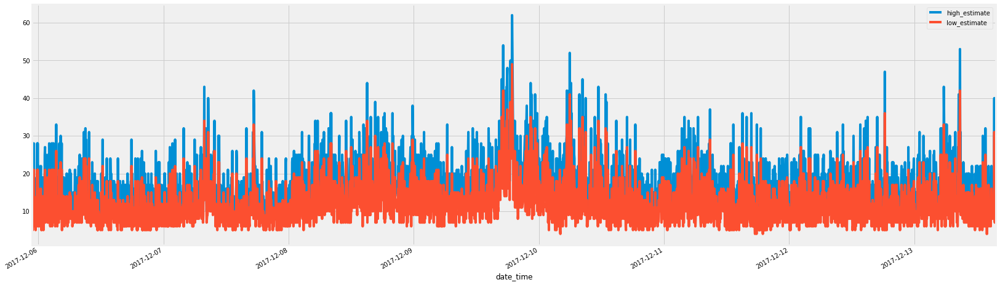

In [59]:
uberX_he.plot()

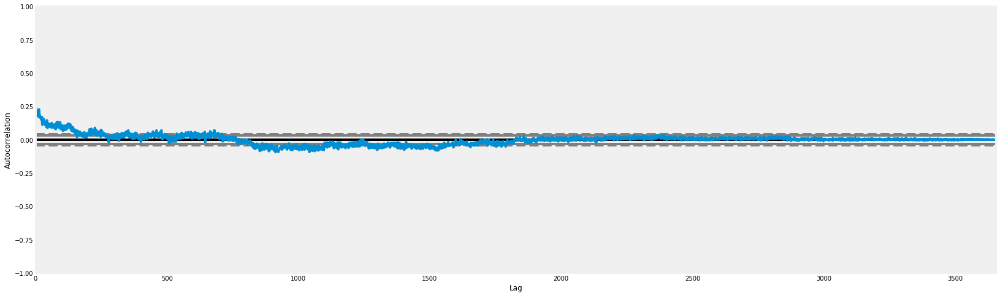

In [60]:
#checking randomness in the uberX dataframe
autocorrelation_plot(uberX_he['high_estimate'])

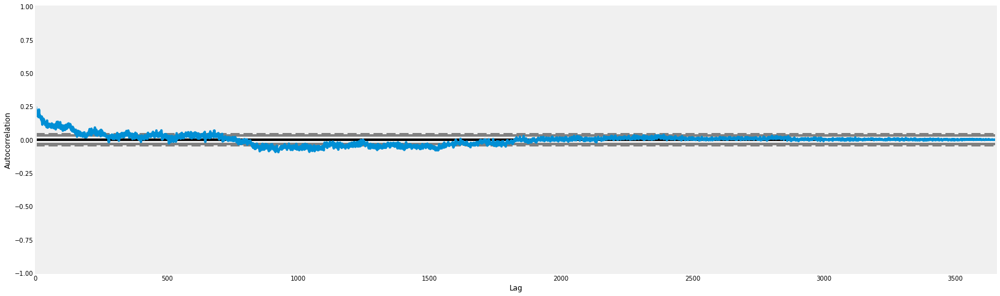

In [61]:
autocorrelation_plot(uberX_he['low_estimate'])

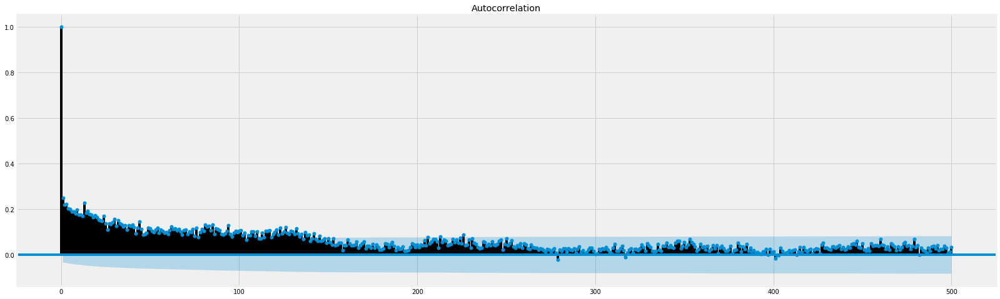

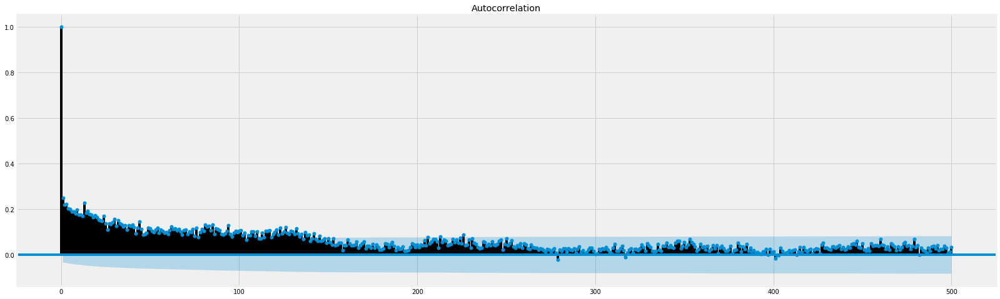

In [62]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(uberX_he['high_estimate'], lags=500)

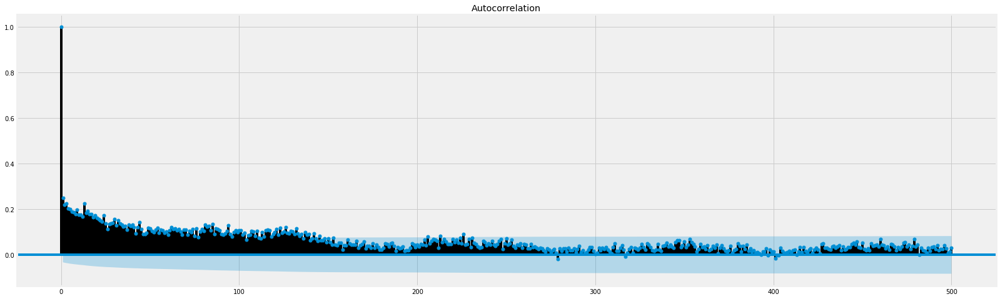

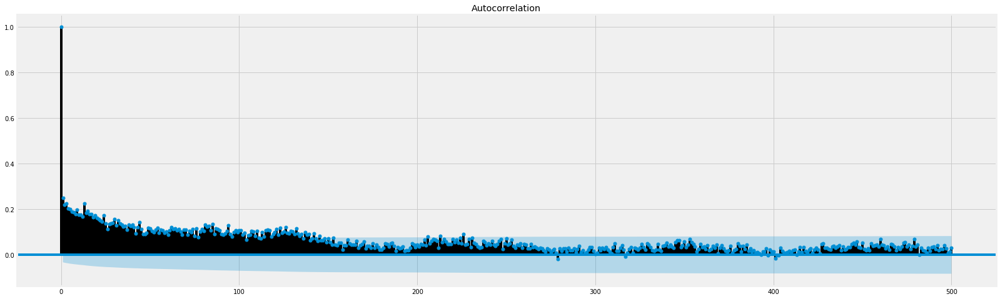

In [63]:
plot_acf(uberX_he['low_estimate'], lags=500)

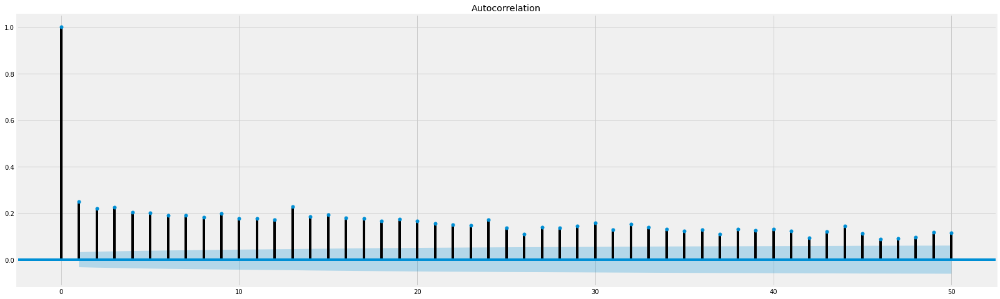

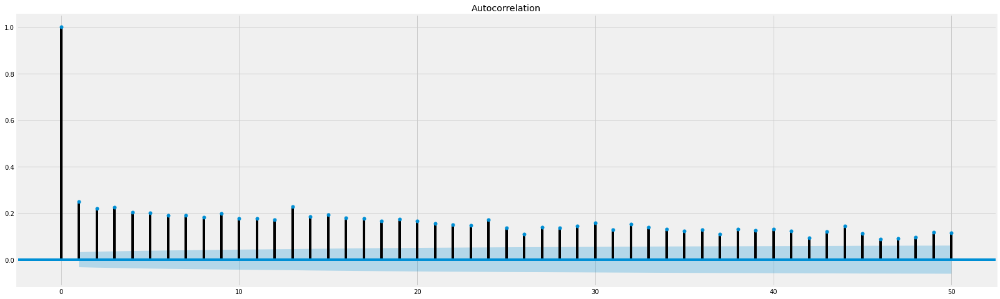

In [64]:
plot_acf(uberX_he['high_estimate'], lags=50)

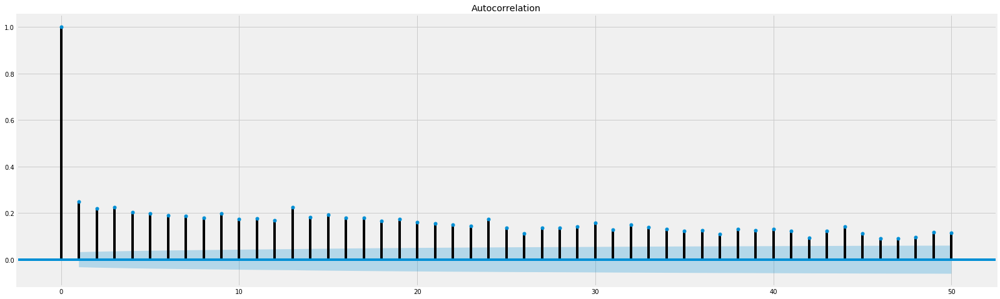

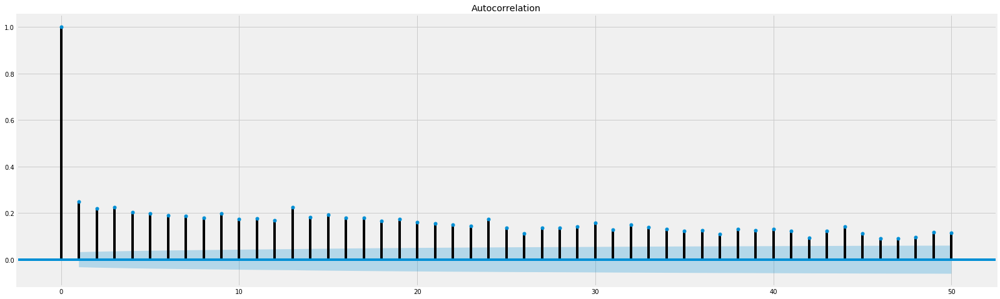

In [65]:
plot_acf(uberX_he['low_estimate'], lags=50)

In [66]:
#resampling to hourly
uberX_he = uberX_he.resample('H').mean()

In [67]:
uberX_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [68]:
uberX_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,11.20,7.20
2017-12-05 23:00:00,15.10,10.65
2017-12-06 00:00:00,14.45,10.20
2017-12-06 01:00:00,16.55,11.95
2017-12-06 02:00:00,16.20,11.55


In [69]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [70]:
mod = sm.tsa.ARIMA(uberX_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:971.1444009475722


In [71]:
mod = sm.tsa.ARIMA(uberX_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:896.5732989977512


In [72]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberX_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:971.1444009475722
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:896.0630802828
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:887.7466564670405
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:871.9712011101353
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:862.1869378169938
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:863.6426814086828
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:882.7017582375412
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:857.4555126929428


In [73]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberX_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:896.5732989977512
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:820.575908536
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:812.7412705870195
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:797.3524721339707
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:787.0770556072421
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:788.6055479652726
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:807.9638580366125
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:782.6631533902821


In [74]:
uberX_he['ln_high_estimate'] = np.log(uberX_he['high_estimate'])
uberX_he['D.ln_high_estimate'] = uberX_he['ln_high_estimate'].diff()

In [75]:
uberX_he['ln_low_estimate'] = np.log(uberX_he['low_estimate'])
uberX_he['D.ln_low_estimate'] = uberX_he['ln_low_estimate'].diff()

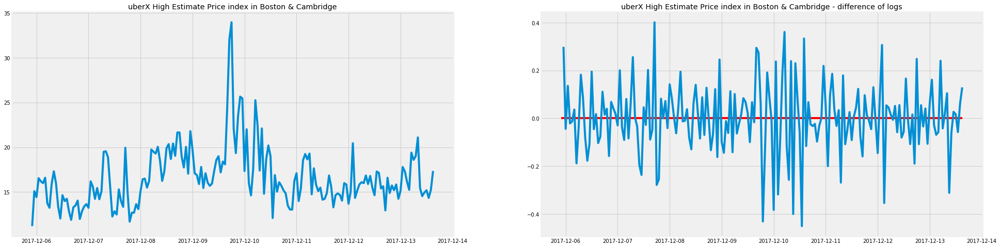

In [76]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberX_he.index._mpl_repr(), uberX_he['high_estimate'], '-')
axes[0].set(title='uberX High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberX_he.index._mpl_repr(), uberX_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, uberX_he.index[0], uberX_he.index[-1], 'r')
axes[1].set(title='uberX High Estimate Price index in Boston & Cambridge - difference of logs');

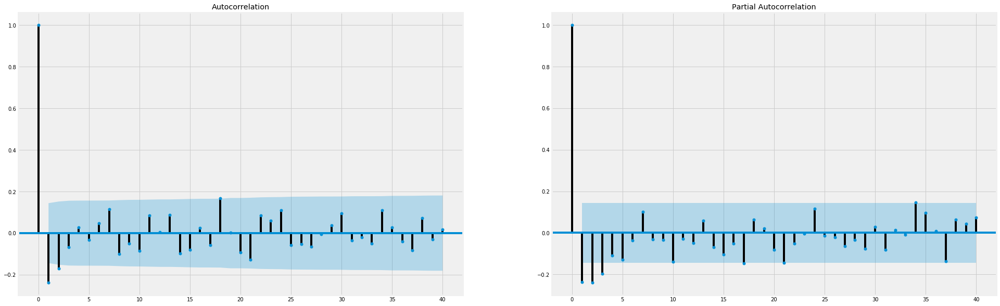

In [77]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberX_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberX_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

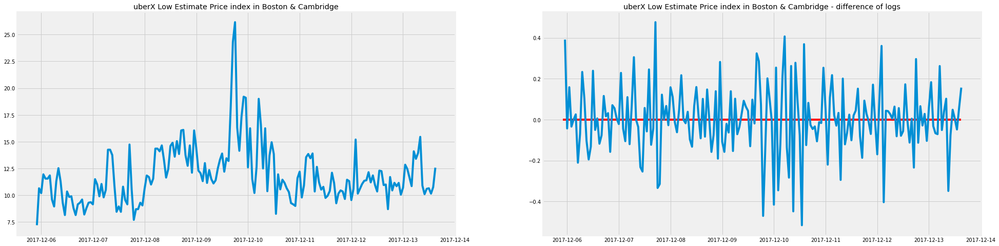

In [78]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberX_he.index._mpl_repr(), uberX_he['low_estimate'], '-')
axes[0].set(title='uberX Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberX_he.index._mpl_repr(), uberX_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, uberX_he.index[0], uberX_he.index[-1], 'r')
axes[1].set(title='uberX Low Estimate Price index in Boston & Cambridge - difference of logs');

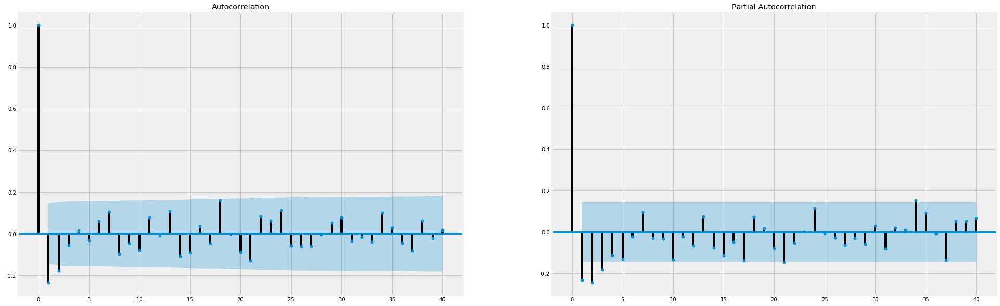

In [79]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberX_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberX_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [80]:
mod = sm.tsa.statespace.SARIMAX(uberX_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 108.559
Date:                Sat, 16 Dec 2017   AIC                           -209.119
Time:                        01:55:12   BIC                           -196.216
Sample:                    12-05-2017   HQIC                          -203.890
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0002      0.000      0.705      0.481      -0.000       0.001
ar.L1          0.6353      0.055     11.562      0.000       0.528       0.743
ma.L1         -0.9862      0.016    -62.580      0.000      -1.017      -0.955
sigma2         0.0179      0.002     11.033      0.000       0.015       0.021
===================================================================================
Ljung-Box (Q):                       46.98   Jarque-Bera (JB):                 3.93
Prob(Q):                              0.21   Prob(JB):                         0.14
Heteroskedasticity (H):               0.79   Skew:                             0.16
Prob(H) (two-sided):                  0.36   Kurtosis:                         3.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [81]:
mod = sm.tsa.statespace.SARIMAX(uberX_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  85.155
Date:                Sat, 16 Dec 2017   AIC                           -162.309
Time:                        01:55:12   BIC                           -149.406
Sample:                    12-05-2017   HQIC                          -157.080
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0003      0.000      0.657      0.511      -0.001       0.001
ar.L1          0.6226      0.060     10.369      0.000       0.505       0.740
ma.L1         -0.9717      0.016    -60.205      0.000      -1.003      -0.940
sigma2         0.0231      0.002     11.110      0.000       0.019       0.027
===================================================================================
Ljung-Box (Q):                       43.10   Jarque-Bera (JB):                 3.74
Prob(Q):                              0.34   Prob(JB):                         0.15
Heteroskedasticity (H):               0.72   Skew:                             0.08
Prob(H) (two-sided):                  0.21   Kurtosis:                         3.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [82]:
# Variables
endog = uberX_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(uberX_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -320.818
Date:                Sat, 16 Dec 2017   AIC                            651.637
Time:                        01:55:12   BIC                            667.712
Sample:                    12-06-2017   HQIC                           658.152
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 16.6271      0.657     25.289      0.000      15.338      17.916
D.ln_high_estimate     8.4803      0.246     34.431      0.000       7.998       8.963
ar.L1                  0.6555      0.038     17.285      0.000       0.581       0.730
ma.L1                  0.7894      0.049     16.194      0.000       0.694       0.885
sigma2                 1.8898      0.144     13.136      0.000       1.608       2.172
===================================================================================
Ljung-Box (Q):                       47.94   Jarque-Bera (JB):               134.02
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             1.06
Prob(H) (two-sided):                  0.37   Kurtosis:                         6.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

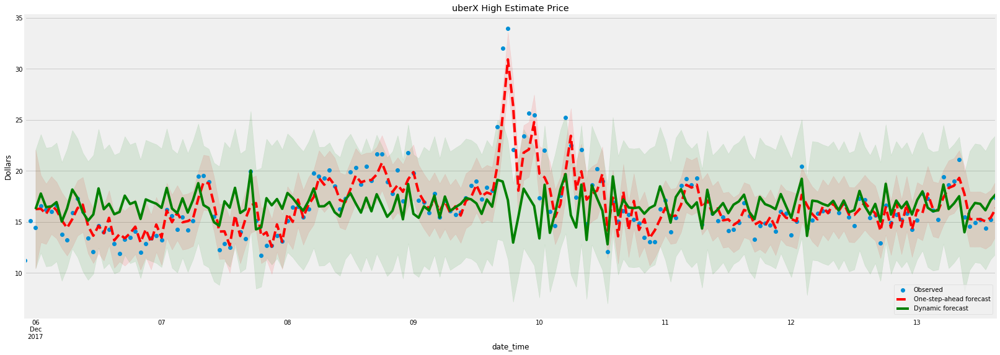

In [83]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberX High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberX_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

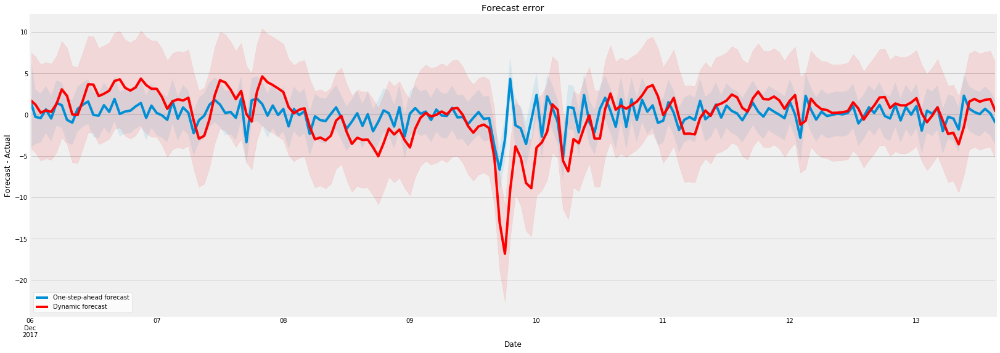

In [84]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [85]:
# Variables
endog = uberX_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(uberX_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -288.090
Date:                Sat, 16 Dec 2017   AIC                            586.180
Time:                        01:55:14   BIC                            602.255
Sample:                    12-06-2017   HQIC                           592.695
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                11.8821      0.541     21.968      0.000      10.822      12.942
D.ln_low_estimate     6.1036      0.198     30.836      0.000       5.716       6.491
ar.L1                 0.6569      0.037     17.804      0.000       0.585       0.729
ma.L1                 0.7443      0.051     14.517      0.000       0.644       0.845
sigma2                1.3254      0.101     13.145      0.000       1.128       1.523
===================================================================================
Ljung-Box (Q):                       48.01   Jarque-Bera (JB):               130.78
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                             1.04
Prob(H) (two-sided):                  0.26   Kurtosis:                         6.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

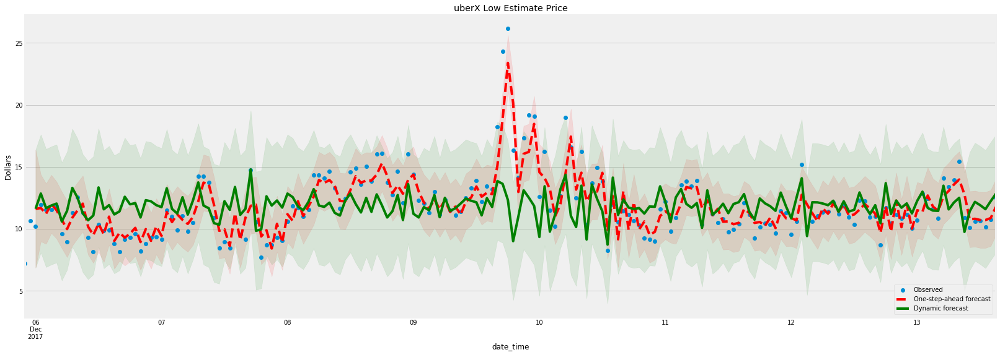

In [86]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberX Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberX_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

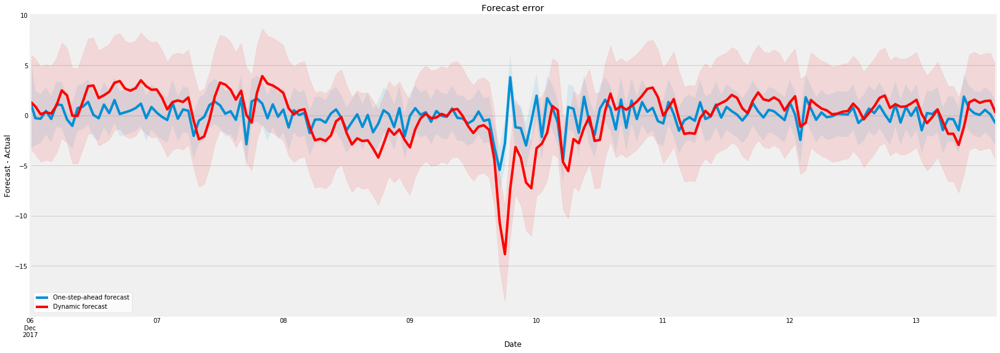

In [87]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

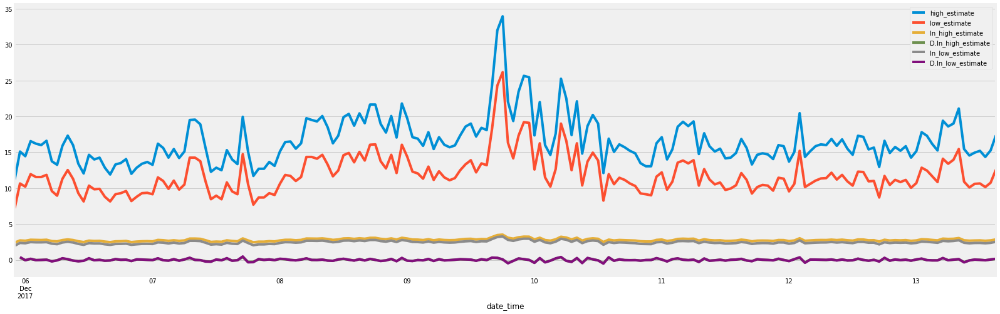

In [88]:
uberX_he.plot()

# uberSUV

In [89]:
uberSUV = uber[uber.display_name == 'uberSUV']
uberSUV.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberSUV,8.24,1080,42.314857,-71.056782,$50-63,63.0,uberSUV,50.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberSUV,6.18,1140,42.272678,-71.093765,$43-54,54.0,uberSUV,43.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberSUV,6.18,1140,42.272678,-71.093765,$43-54,54.0,uberSUV,43.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,uberSUV,8.53,1320,42.247948,-71.173050,$55-69,69.0,uberSUV,55.0,6d318bcc-22a3-4af6-bddd-b409bfce1546,42.342588,-71.122463,22:51:50


In [90]:
uberSUV_col_list = ['high_estimate', 'low_estimate']
uberSUV_he = uberSUV[uberSUV_col_list]
uberSUV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,63.0,50.0
2017-12-05 22:48:00,63.0,50.0
2017-12-05 22:49:00,54.0,43.0
2017-12-05 22:49:00,54.0,43.0
2017-12-05 22:52:00,69.0,55.0


In [91]:
#remove duplicated datetimeindex
uberSUV_he = uberSUV_he[~uberSUV_he.index.duplicated(keep = 'first')]
uberSUV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,63.0,50.0
2017-12-05 22:49:00,54.0,43.0
2017-12-05 22:52:00,69.0,55.0
2017-12-05 22:55:00,38.0,30.0
2017-12-05 22:58:00,42.0,34.0


In [92]:
print(min(uberSUV_he.index))
print(max(uberSUV_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


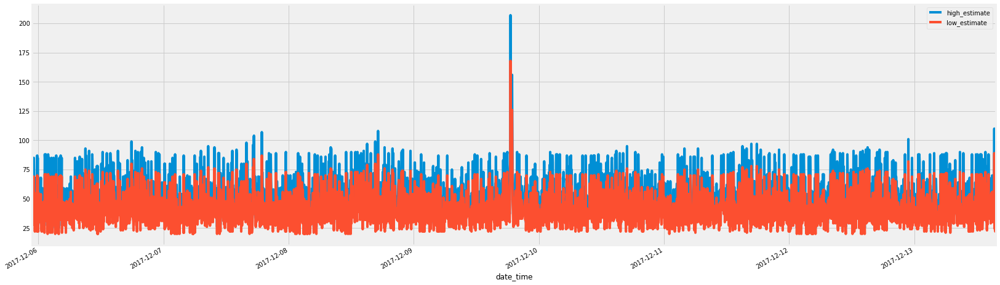

In [93]:
uberSUV_he.plot()

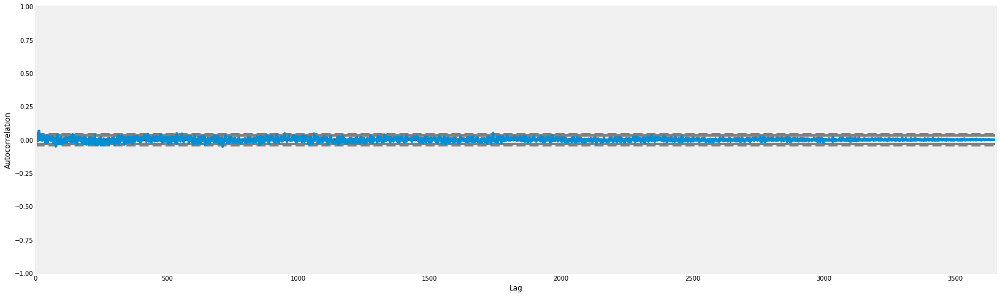

In [94]:
#checking randomness in the uberSUV dataframe
autocorrelation_plot(uberSUV_he['high_estimate'])

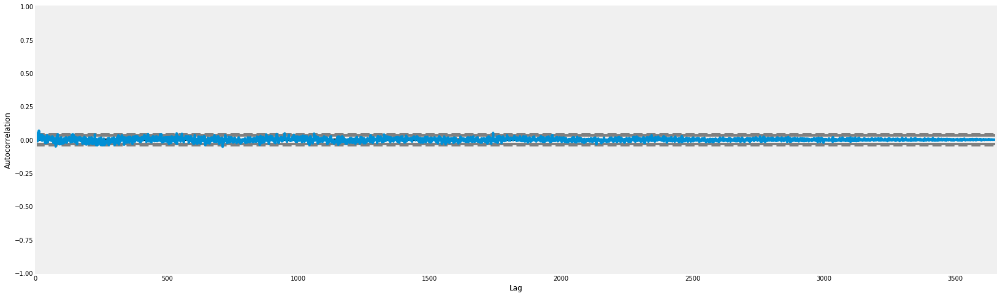

In [95]:
autocorrelation_plot(uberSUV_he['low_estimate'])

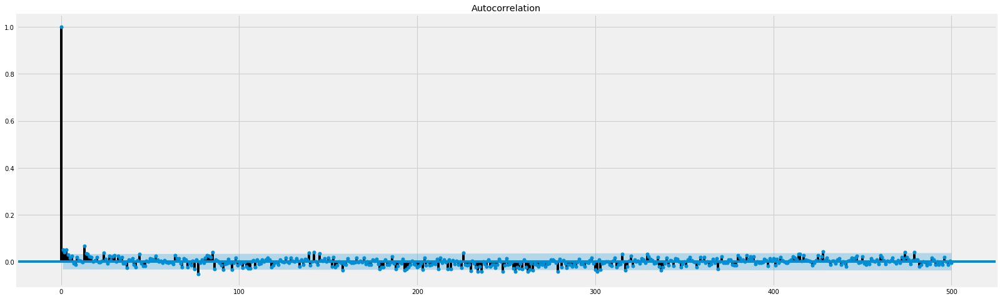

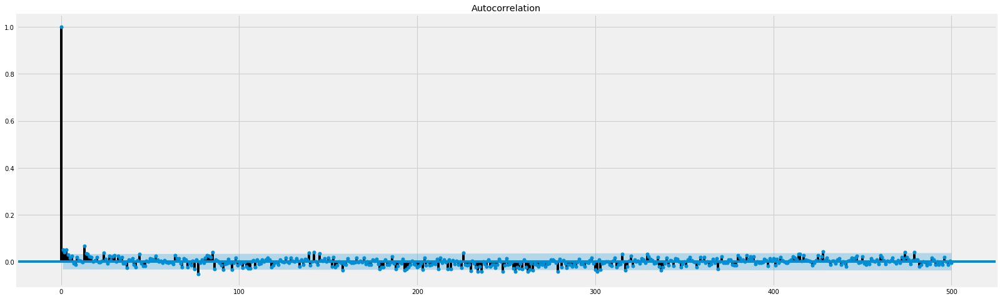

In [96]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(uberSUV_he['high_estimate'], lags=500)

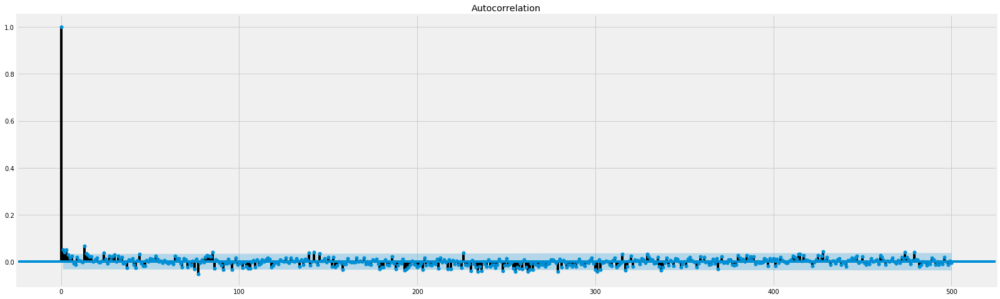

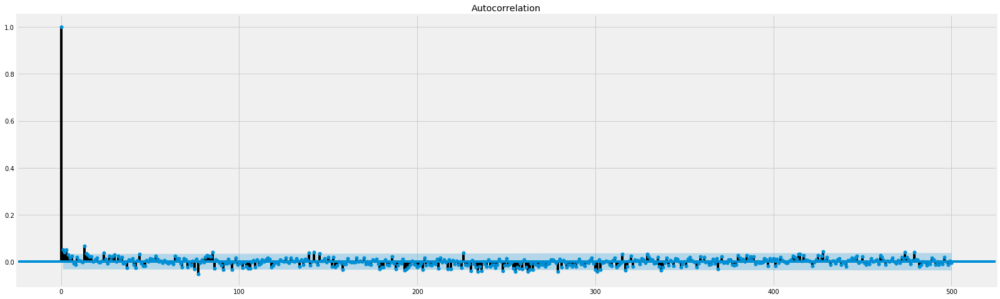

In [97]:
plot_acf(uberSUV_he['low_estimate'], lags=500)

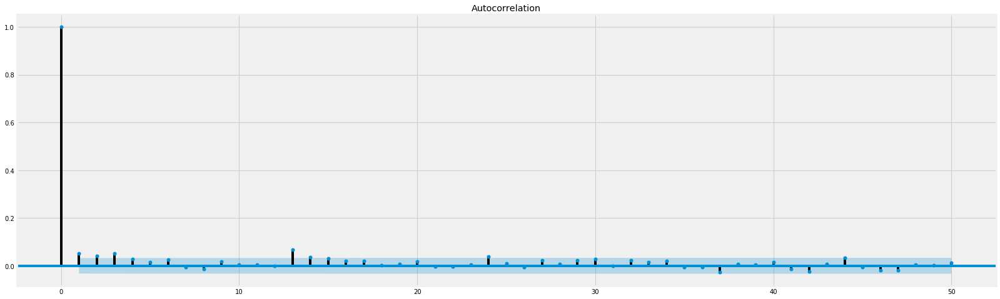

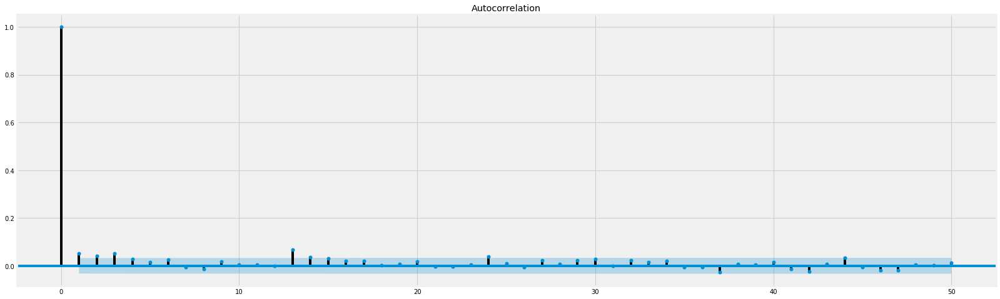

In [98]:
plot_acf(uberSUV_he['high_estimate'], lags=50)

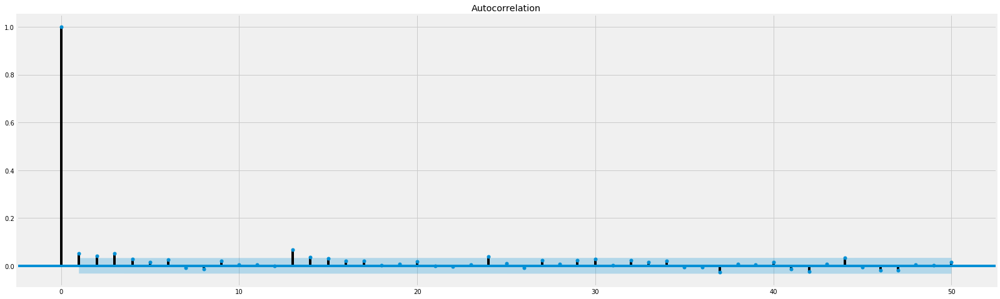

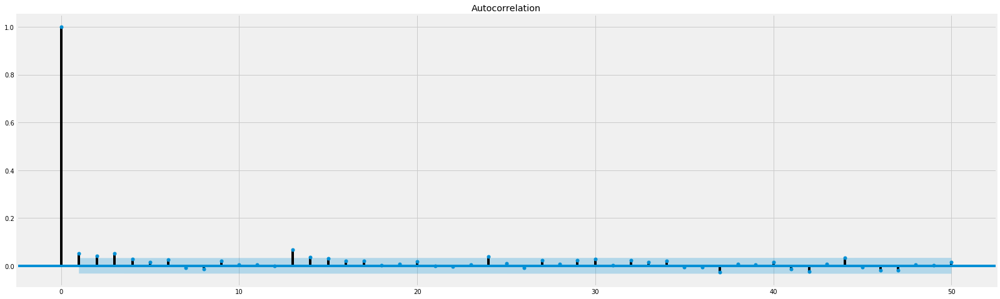

In [99]:
plot_acf(uberSUV_he['low_estimate'], lags=50)

In [100]:
#resampling to hourly
uberSUV_he = uberSUV_he.resample('H').mean()

In [101]:
uberSUV_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [102]:
uberSUV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,53.20,42.40
2017-12-05 23:00:00,53.85,43.30
2017-12-06 00:00:00,49.60,39.60
2017-12-06 01:00:00,57.80,46.35
2017-12-06 02:00:00,52.10,41.70


In [103]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [104]:
mod = sm.tsa.ARIMA(uberSUV_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:1110.477470559686


In [105]:
mod = sm.tsa.ARIMA(uberSUV_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:1035.1988374353787


In [106]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberSUV_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:1110.477470559686
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:1105.8633176396256
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1196.8205462705
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:1112.540935381783
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:1106.3401145237099
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:1106.6256531032577
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1168.418388743285
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:1108.0961832222656


In [107]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberSUV_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:1035.1988374353787
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:1030.4498582979697
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1121.5383718753617
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:1037.6503811394869
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:1030.929628811382
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:1031.3042557442484
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1093.2917773385375
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:1033.0766645956005


In [108]:
uberSUV_he['ln_high_estimate'] = np.log(uberSUV_he['high_estimate'])
uberSUV_he['D.ln_high_estimate'] = uberSUV_he['ln_high_estimate'].diff()

In [109]:
uberSUV_he['ln_low_estimate'] = np.log(uberSUV_he['low_estimate'])
uberSUV_he['D.ln_low_estimate'] = uberSUV_he['ln_low_estimate'].diff()

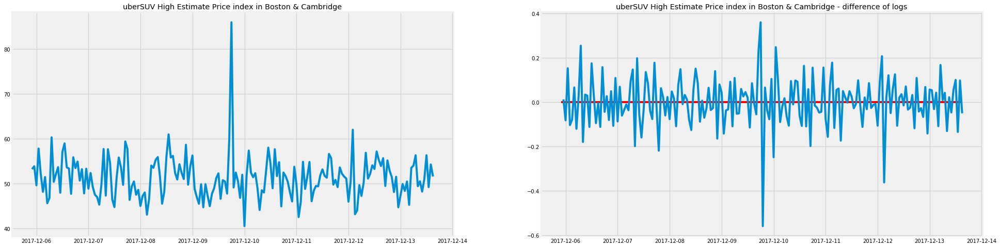

In [110]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberSUV_he.index._mpl_repr(), uberSUV_he['high_estimate'], '-')
axes[0].set(title='uberSUV High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberSUV_he.index._mpl_repr(), uberSUV_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, uberSUV_he.index[0], uberSUV_he.index[-1], 'r')
axes[1].set(title='uberSUV High Estimate Price index in Boston & Cambridge - difference of logs');

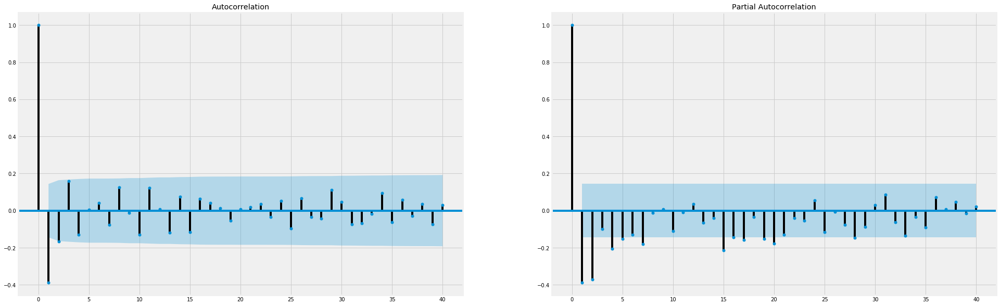

In [111]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberSUV_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberSUV_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

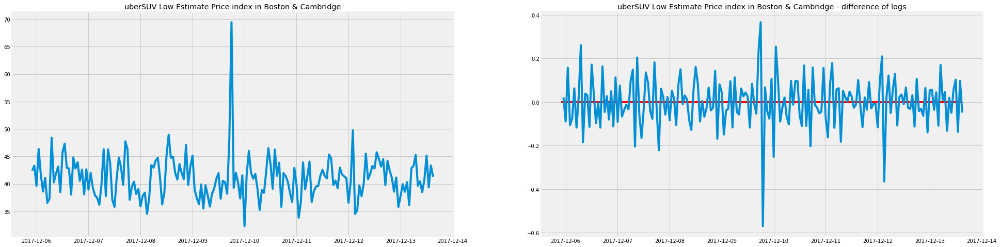

In [112]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberSUV_he.index._mpl_repr(), uberSUV_he['low_estimate'], '-')
axes[0].set(title='uberSUV Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberSUV_he.index._mpl_repr(), uberSUV_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, uberSUV_he.index[0], uberSUV_he.index[-1], 'r')
axes[1].set(title='uberSUV Low Estimate Price index in Boston & Cambridge - difference of logs');

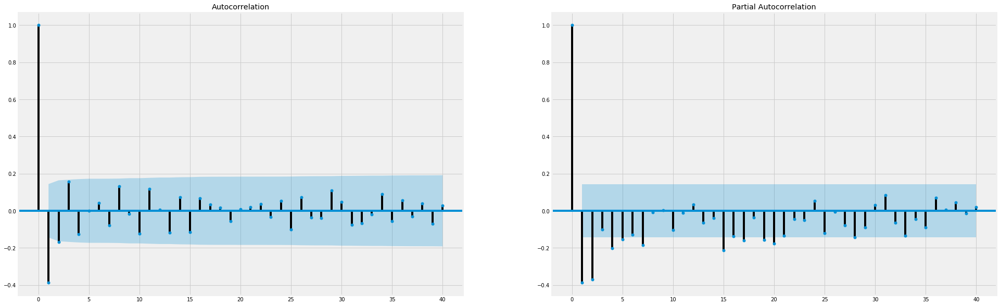

In [113]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberSUV_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberSUV_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [114]:
mod = sm.tsa.statespace.SARIMAX(uberSUV_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 189.785
Date:                Sat, 16 Dec 2017   AIC                           -371.570
Time:                        01:55:21   BIC                           -358.667
Sample:                    12-05-2017   HQIC                          -366.341
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -4.782e-05      0.000     -0.317      0.751      -0.000       0.000
ar.L1          0.1969      0.066      2.989      0.003       0.068       0.326
ma.L1         -0.9999      7.433     -0.135      0.893     -15.568      13.568
sigma2         0.0073      0.054      0.135      0.893      -0.099       0.114
===================================================================================
Ljung-Box (Q):                       52.29   Jarque-Bera (JB):               200.73
Prob(Q):                              0.09   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                             0.91
Prob(H) (two-sided):                  0.26   Kurtosis:                         7.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [115]:
mod = sm.tsa.statespace.SARIMAX(uberSUV_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 186.376
Date:                Sat, 16 Dec 2017   AIC                           -364.753
Time:                        01:55:22   BIC                           -351.850
Sample:                    12-05-2017   HQIC                          -359.524
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -5.003e-05      0.000     -0.318      0.751      -0.000       0.000
ar.L1          0.1987      0.066      3.019      0.003       0.070       0.328
ma.L1         -0.9990      0.744     -1.342      0.180      -2.458       0.460
sigma2         0.0076      0.006      1.339      0.181      -0.004       0.019
===================================================================================
Ljung-Box (Q):                       52.28   Jarque-Bera (JB):               195.95
Prob(Q):                              0.09   Prob(JB):                         0.00
Heteroskedasticity (H):               0.74   Skew:                             0.90
Prob(H) (two-sided):                  0.25   Kurtosis:                         7.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [116]:
# Variables
endog = uberSUV_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(uberSUV_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -446.876
Date:                Sat, 16 Dec 2017   AIC                            903.752
Time:                        01:55:22   BIC                            919.827
Sample:                    12-06-2017   HQIC                           910.268
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 51.3057      0.500    102.688      0.000      50.326      52.285
D.ln_high_estimate    27.4460      1.139     24.097      0.000      25.214      29.678
ar.L1                  0.1049      0.078      1.336      0.181      -0.049       0.259
ma.L1                  0.7994      0.063     12.736      0.000       0.676       0.922
sigma2                 7.4857      0.436     17.167      0.000       6.631       8.340
===================================================================================
Ljung-Box (Q):                       51.37   Jarque-Bera (JB):              2324.23
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               0.76   Skew:                             2.45
Prob(H) (two-sided):                  0.28   Kurtosis:                        19.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

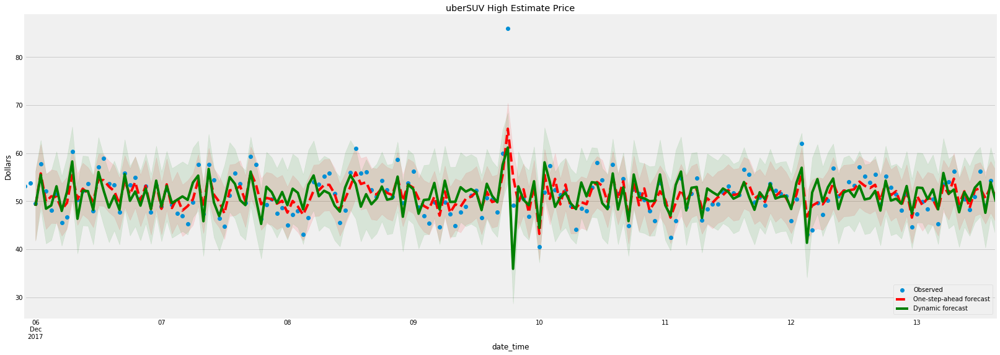

In [117]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberSUV High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberSUV_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

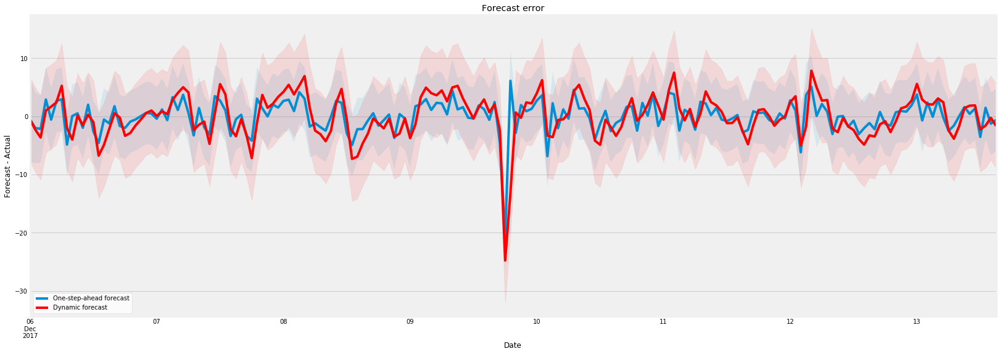

In [118]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [119]:
# Variables
endog = uberSUV_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(uberSUV_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -409.999
Date:                Sat, 16 Dec 2017   AIC                            829.999
Time:                        01:55:23   BIC                            846.073
Sample:                    12-06-2017   HQIC                           836.514
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                41.0705      0.410    100.155      0.000      40.267      41.874
D.ln_low_estimate    21.9795      0.922     23.846      0.000      20.173      23.786
ar.L1                 0.1068      0.079      1.359      0.174      -0.047       0.261
ma.L1                 0.7957      0.063     12.533      0.000       0.671       0.920
sigma2                5.0140      0.291     17.250      0.000       4.444       5.584
===================================================================================
Ljung-Box (Q):                       51.57   Jarque-Bera (JB):              2384.06
Prob(Q):                              0.10   Prob(JB):                         0.00
Heteroskedasticity (H):               0.76   Skew:                             2.48
Prob(H) (two-sided):                  0.28   Kurtosis:                        19.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

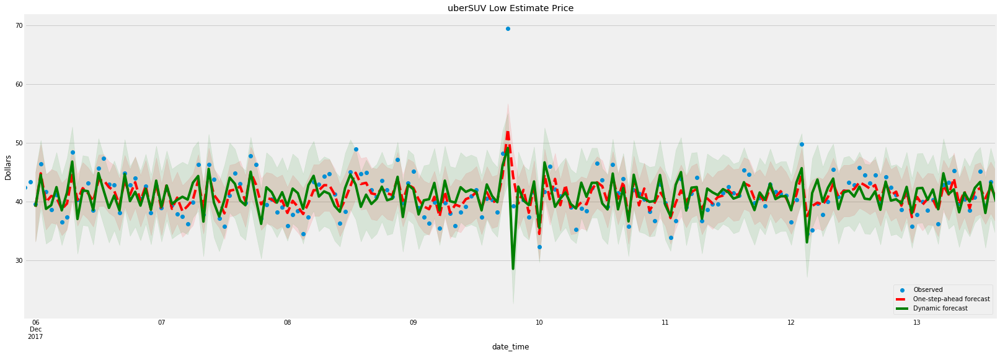

In [120]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberSUV Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberSUV_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

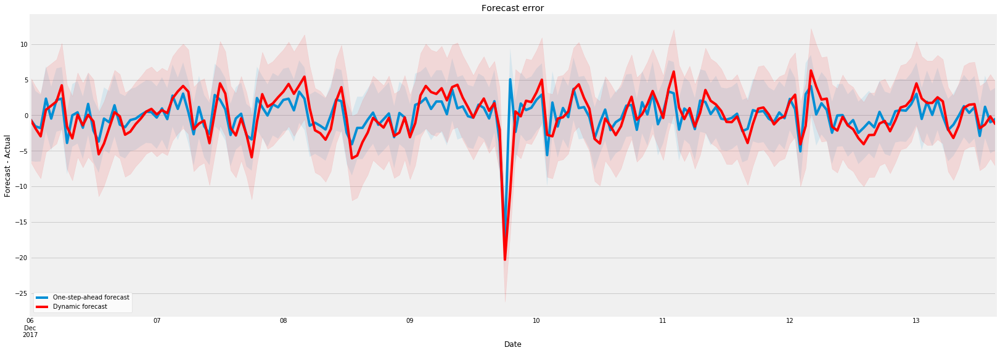

In [121]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

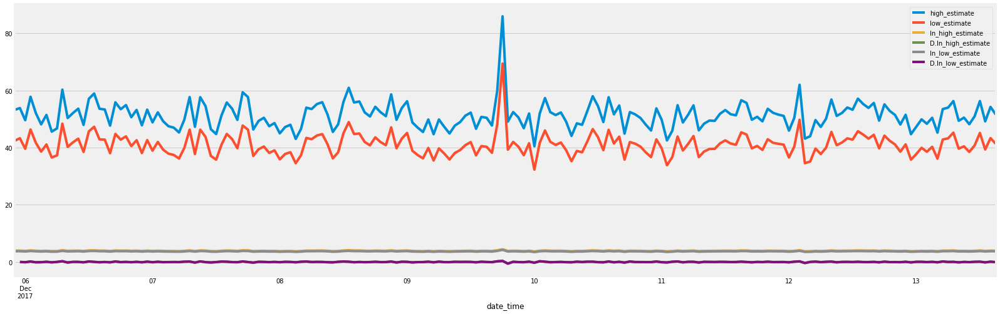

In [122]:
uberSUV_he.plot()

# uberXL

In [123]:
uberXL = uber[uber.display_name == 'uberXL']
uberXL.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberXL,8.24,1080,42.314857,-71.056782,$28-35,35.0,uberXL,28.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberXL,6.18,1140,42.272678,-71.093765,$23-30,30.0,uberXL,23.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberXL,6.18,1140,42.272678,-71.093765,$23-30,30.0,uberXL,23.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,uberXL,8.53,1320,42.247948,-71.173050,$30-38,38.0,uberXL,30.0,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,42.342588,-71.122463,22:51:50


In [124]:
uberXL_col_list = ['high_estimate', 'low_estimate']
uberXL_he = uberXL[uberXL_col_list]
uberXL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,35.0,28.0
2017-12-05 22:48:00,35.0,28.0
2017-12-05 22:49:00,30.0,23.0
2017-12-05 22:49:00,30.0,23.0
2017-12-05 22:52:00,38.0,30.0


In [125]:
#remove duplicated datetimeindex
uberXL_he = uberXL_he[~uberXL_he.index.duplicated(keep = 'first')]
uberXL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,35.0,28.0
2017-12-05 22:49:00,30.0,23.0
2017-12-05 22:52:00,38.0,30.0
2017-12-05 22:55:00,20.0,16.0
2017-12-05 22:58:00,23.0,18.0


In [126]:
print(min(uberXL_he.index))
print(max(uberXL_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


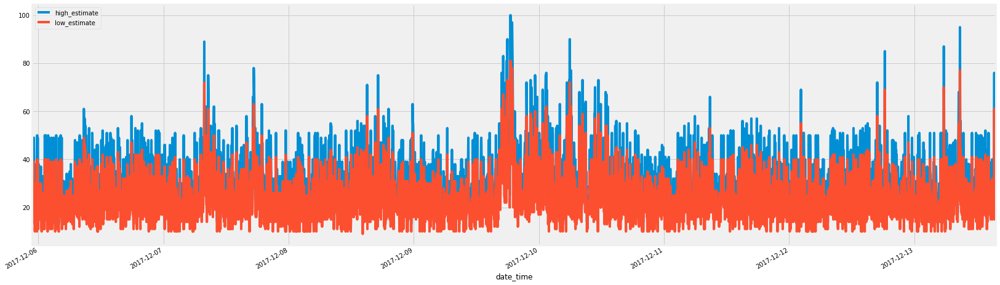

In [127]:
uberXL_he.plot()

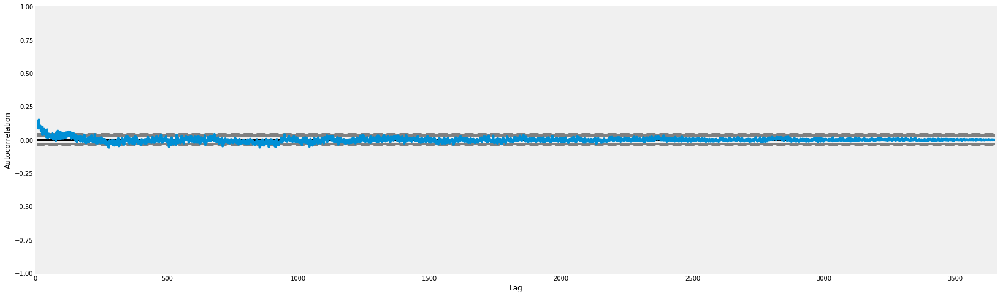

In [128]:
#checking randomness in the uberXL dataframe
autocorrelation_plot(uberXL_he['high_estimate'])

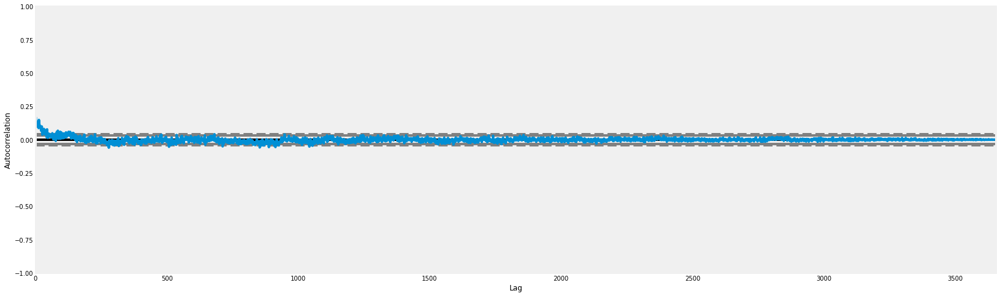

In [129]:
autocorrelation_plot(uberXL_he['low_estimate'])

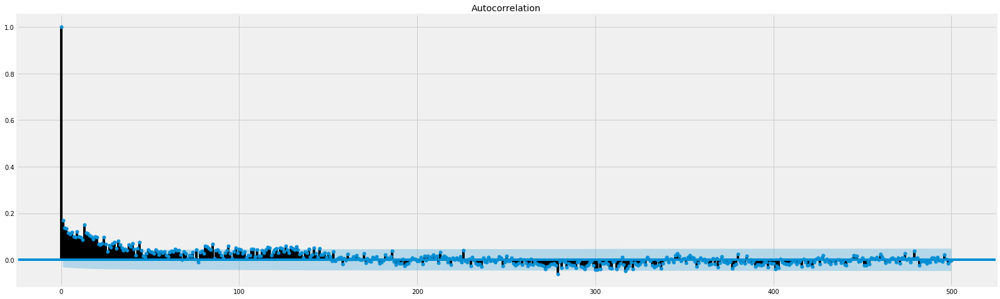

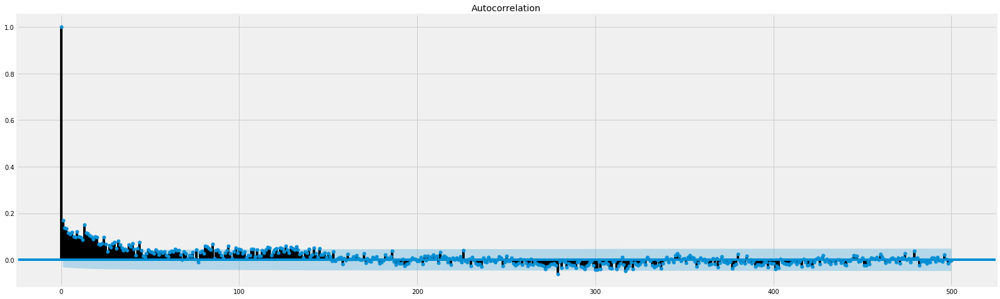

In [130]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(uberXL_he['high_estimate'], lags=500)

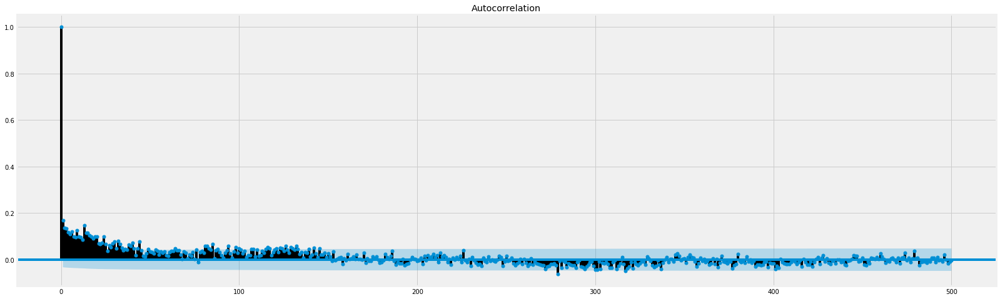

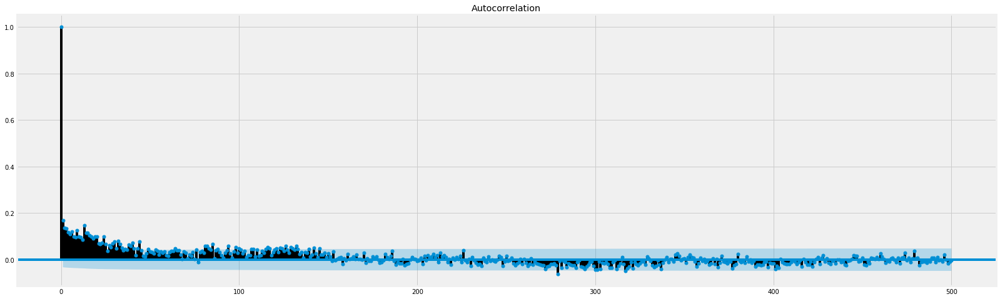

In [131]:
plot_acf(uberXL_he['low_estimate'], lags=500)

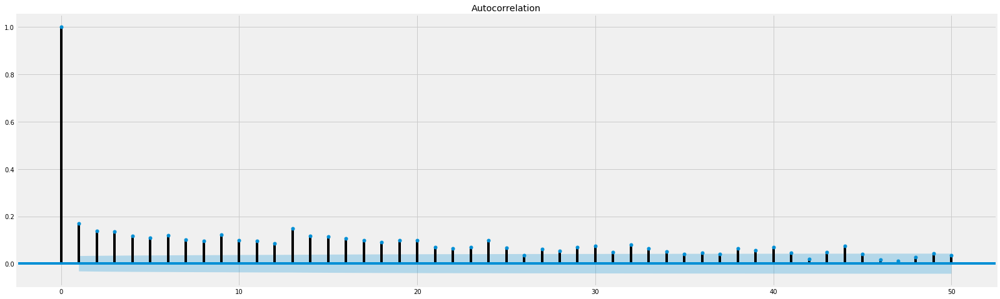

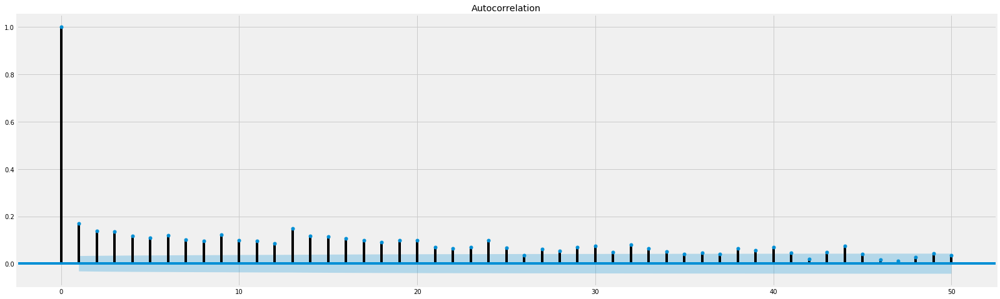

In [132]:
plot_acf(uberXL_he['high_estimate'], lags=50)

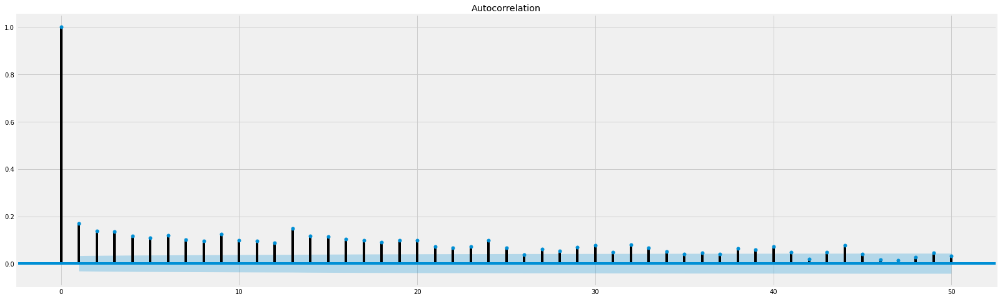

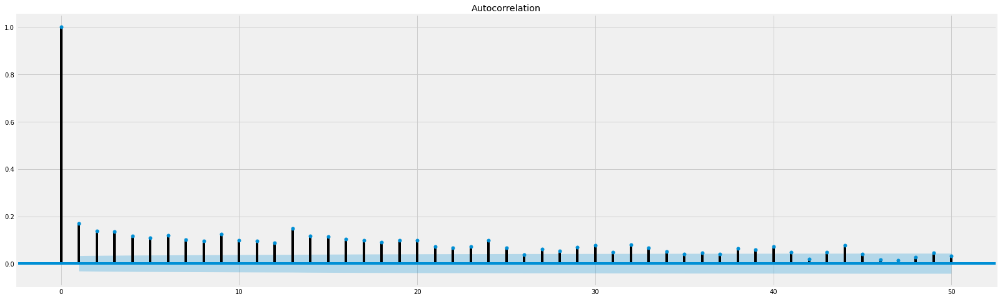

In [133]:
plot_acf(uberXL_he['low_estimate'], lags=50)

In [134]:
#resampling to hourly
uberXL_he = uberXL_he.resample('H').mean()

In [135]:
uberXL_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [136]:
uberXL_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,29.2,23.00
2017-12-05 23:00:00,29.6,23.35
2017-12-06 00:00:00,27.0,21.10
2017-12-06 01:00:00,32.1,25.35
2017-12-06 02:00:00,28.6,22.50


In [137]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [138]:
mod = sm.tsa.ARIMA(uberXL_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:1126.5587068078755


In [139]:
mod = sm.tsa.ARIMA(uberXL_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:1052.199928963737


In [140]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberXL_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:1126.5587068078755
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:1077.3705306072247
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1110.7296204000836
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:1091.3035625447583
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:1068.0812250286908
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:1069.691474240742
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1104.881875087487
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:1069.0940832562173


In [141]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberXL_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:1052.199928963737
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:1002.7226238991908
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1035.6578540969108
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:1016.5910941382517
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:992.9492327482888
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:994.5907096891023
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1029.8433064288545
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:994.3554621552128


In [142]:
uberXL_he['ln_high_estimate'] = np.log(uberXL_he['high_estimate'])
uberXL_he['D.ln_high_estimate'] = uberXL_he['ln_high_estimate'].diff()

In [143]:
uberXL_he['ln_low_estimate'] = np.log(uberXL_he['low_estimate'])
uberXL_he['D.ln_low_estimate'] = uberXL_he['ln_low_estimate'].diff()

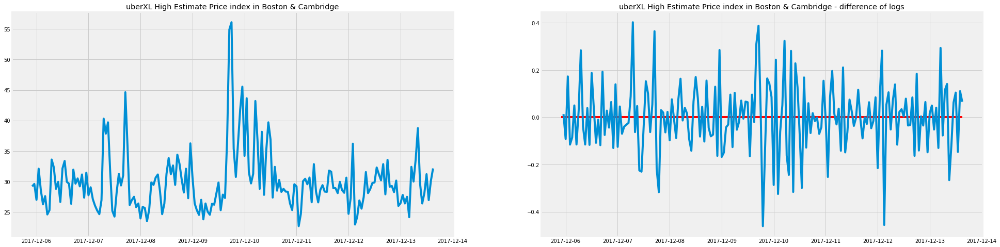

In [144]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberXL_he.index._mpl_repr(), uberXL_he['high_estimate'], '-')
axes[0].set(title='uberXL High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberXL_he.index._mpl_repr(), uberXL_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, uberXL_he.index[0], uberXL_he.index[-1], 'r')
axes[1].set(title='uberXL High Estimate Price index in Boston & Cambridge - difference of logs');

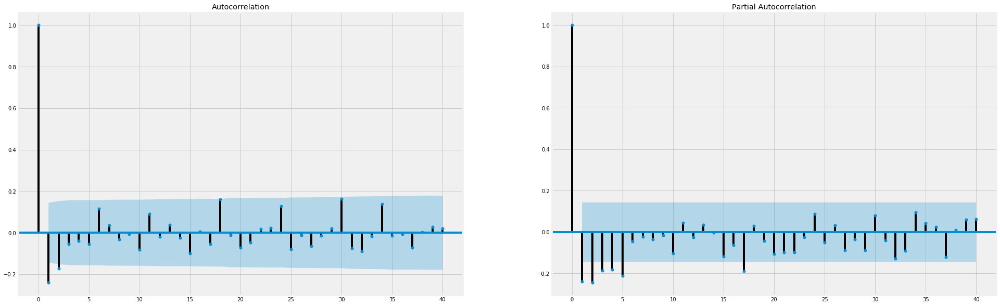

In [145]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberXL_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberXL_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

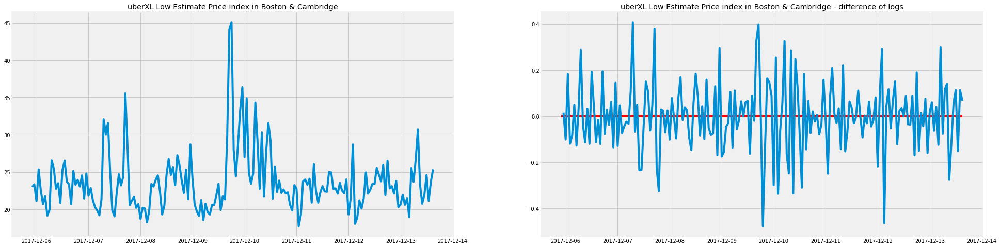

In [146]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberXL_he.index._mpl_repr(), uberXL_he['low_estimate'], '-')
axes[0].set(title='uberXL Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberXL_he.index._mpl_repr(), uberXL_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, uberXL_he.index[0], uberXL_he.index[-1], 'r')
axes[1].set(title='uberXL Low Estimate Price index in Boston & Cambridge - difference of logs');

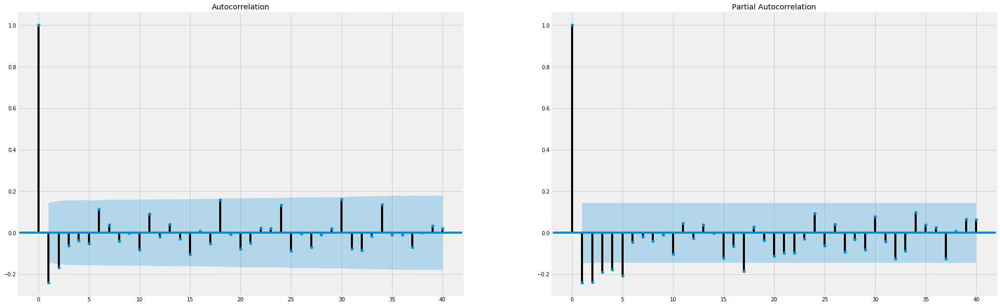

In [147]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberXL_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberXL_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [148]:
mod = sm.tsa.statespace.SARIMAX(uberXL_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 118.398
Date:                Sat, 16 Dec 2017   AIC                           -228.796
Time:                        01:55:31   BIC                           -215.893
Sample:                    12-05-2017   HQIC                          -223.567
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.927e-05      0.000      0.090      0.928      -0.000       0.000
ar.L1          0.5236      0.053      9.795      0.000       0.419       0.628
ma.L1         -0.9996      0.614     -1.629      0.103      -2.202       0.203
sigma2         0.0159      0.010      1.621      0.105      -0.003       0.035
===================================================================================
Ljung-Box (Q):                       34.10   Jarque-Bera (JB):                42.90
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                             0.85
Prob(H) (two-sided):                  0.36   Kurtosis:                         4.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [149]:
mod = sm.tsa.statespace.SARIMAX(uberXL_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 111.157
Date:                Sat, 16 Dec 2017   AIC                           -214.315
Time:                        01:55:31   BIC                           -201.412
Sample:                    12-05-2017   HQIC                          -209.086
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   7.198e-05      0.001      0.080      0.936      -0.002       0.002
ar.L1          0.4614      0.061      7.555      0.000       0.342       0.581
ma.L1         -0.9242      0.033    -27.588      0.000      -0.990      -0.859
sigma2         0.0175      0.002     11.452      0.000       0.015       0.021
===================================================================================
Ljung-Box (Q):                       36.42   Jarque-Bera (JB):                36.73
Prob(Q):                              0.63   Prob(JB):                         0.00
Heteroskedasticity (H):               0.76   Skew:                             0.75
Prob(H) (two-sided):                  0.27   Kurtosis:                         4.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [150]:
# Variables
endog = uberXL_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(uberXL_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -422.598
Date:                Sat, 16 Dec 2017   AIC                            855.196
Time:                        01:55:31   BIC                            871.270
Sample:                    12-06-2017   HQIC                           861.711
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 30.0061      0.916     32.765      0.000      28.211      31.801
D.ln_high_estimate    15.9600      0.511     31.235      0.000      14.959      16.962
ar.L1                  0.5089      0.057      8.870      0.000       0.396       0.621
ma.L1                  0.7967      0.050     15.808      0.000       0.698       0.895
sigma2                 5.7246      0.339     16.903      0.000       5.061       6.388
===================================================================================
Ljung-Box (Q):                       31.42   Jarque-Bera (JB):               751.96
Prob(Q):                              0.83   Prob(JB):                         0.00
Heteroskedasticity (H):               0.74   Skew:                             2.14
Prob(H) (two-sided):                  0.24   Kurtosis:                        11.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

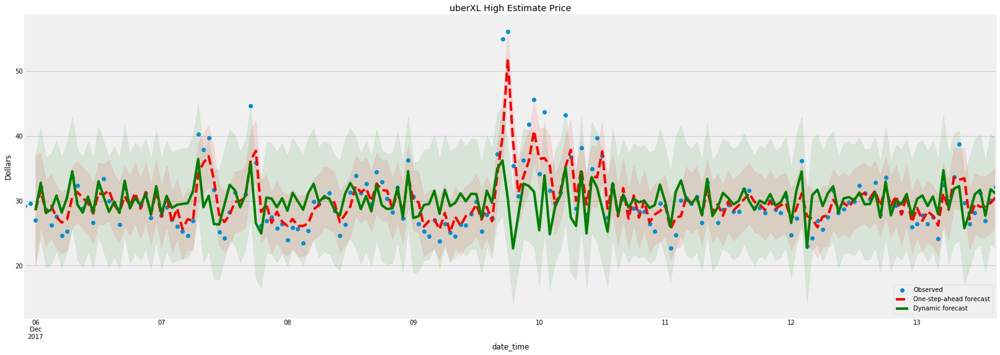

In [151]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberXL High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberXL_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

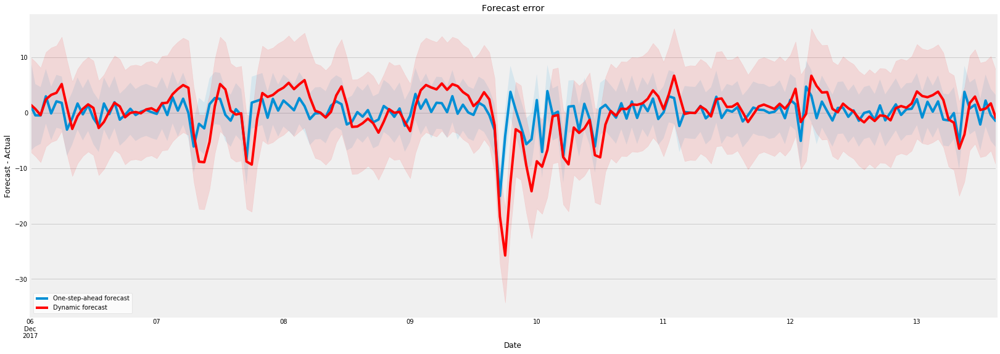

In [152]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [153]:
# Variables
endog = uberXL_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(uberXL_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -386.629
Date:                Sat, 16 Dec 2017   AIC                            783.258
Time:                        01:55:32   BIC                            799.333
Sample:                    12-06-2017   HQIC                           789.773
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                23.6377      0.757     31.242      0.000      22.155      25.121
D.ln_low_estimate    12.6044      0.416     30.310      0.000      11.789      13.420
ar.L1                 0.5107      0.057      8.970      0.000       0.399       0.622
ma.L1                 0.7871      0.051     15.289      0.000       0.686       0.888
sigma2                3.8730      0.228     16.991      0.000       3.426       4.320
===================================================================================
Ljung-Box (Q):                       31.46   Jarque-Bera (JB):               791.89
Prob(Q):                              0.83   Prob(JB):                         0.00
Heteroskedasticity (H):               0.72   Skew:                             2.18
Prob(H) (two-sided):                  0.20   Kurtosis:                        12.18
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

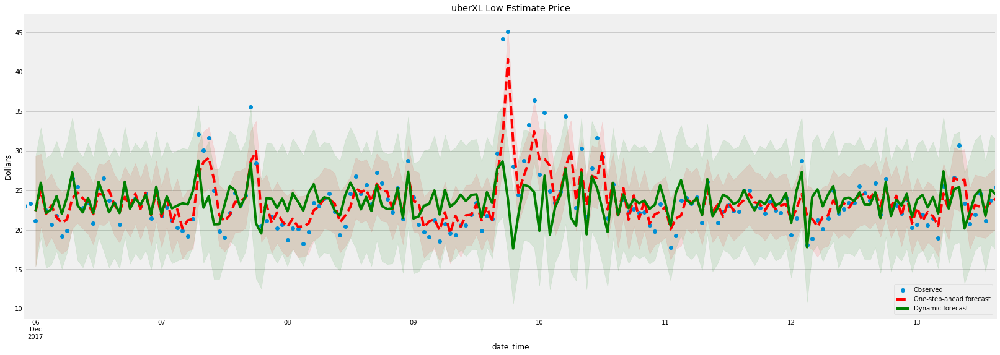

In [154]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberXL Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberXL_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

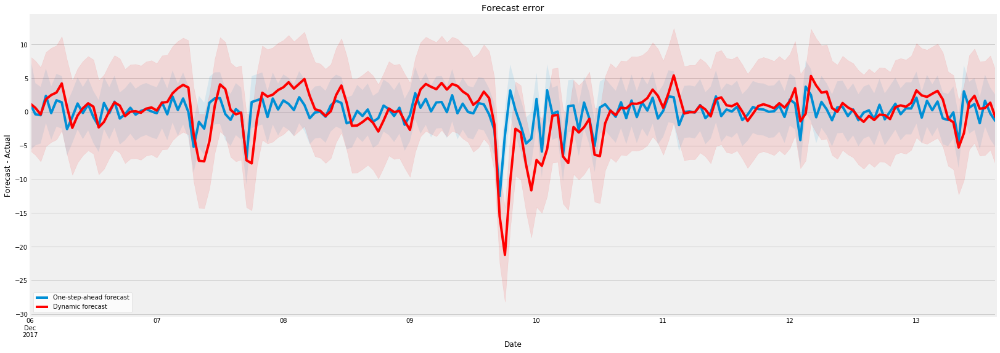

In [155]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

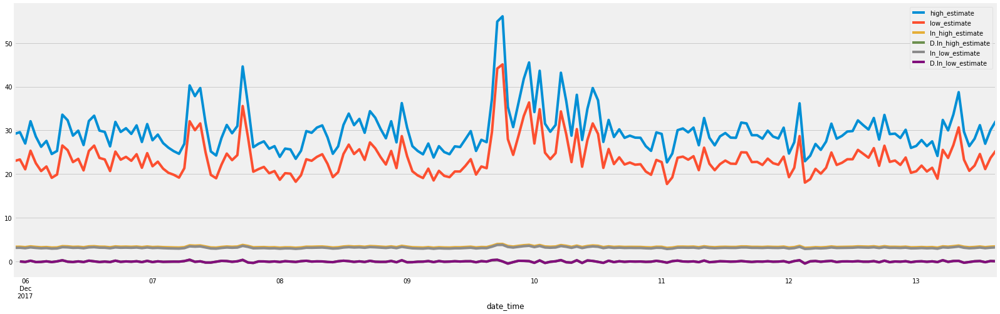

In [156]:
uberXL_he.plot()

# UberBLACK

In [157]:
UberBLACK = uber[uber.display_name == 'UberBLACK']
UberBLACK.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,UberBLACK,8.24,1080,42.314857,-71.056782,$41-51,51.0,UberBLACK,41.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,UberBLACK,6.18,1140,42.272678,-71.093765,$34-43,43.0,UberBLACK,34.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,UberBLACK,6.18,1140,42.272678,-71.093765,$34-43,43.0,UberBLACK,34.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,UberBLACK,8.53,1320,42.247948,-71.173050,$45-57,57.0,UberBLACK,45.0,6c84fd89-3f11-4782-9b50-97c468b19529,42.342588,-71.122463,22:51:50


In [158]:
UberBLACK_col_list = ['high_estimate', 'low_estimate']
UberBLACK_he = UberBLACK[UberBLACK_col_list]
UberBLACK_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,51.0,41.0
2017-12-05 22:48:00,51.0,41.0
2017-12-05 22:49:00,43.0,34.0
2017-12-05 22:49:00,43.0,34.0
2017-12-05 22:52:00,57.0,45.0


In [159]:
#remove duplicated datetimeindex
UberBLACK_he = UberBLACK_he[~UberBLACK_he.index.duplicated(keep = 'first')]
UberBLACK_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,51.0,41.0
2017-12-05 22:49:00,43.0,34.0
2017-12-05 22:52:00,57.0,45.0
2017-12-05 22:55:00,28.0,22.0
2017-12-05 22:58:00,32.0,26.0


In [160]:
print(min(UberBLACK_he.index))
print(max(UberBLACK_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


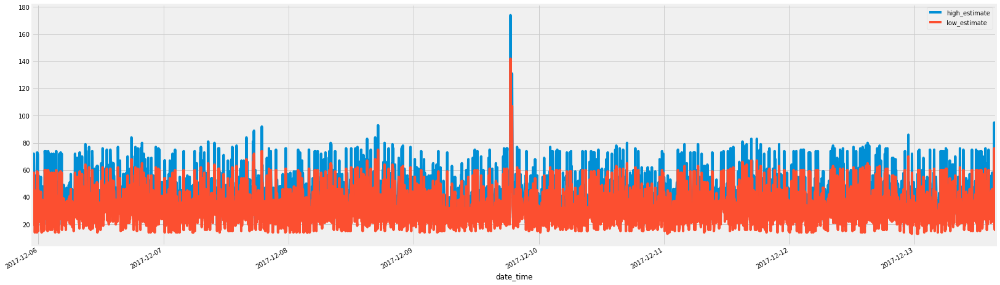

In [161]:
UberBLACK_he.plot()

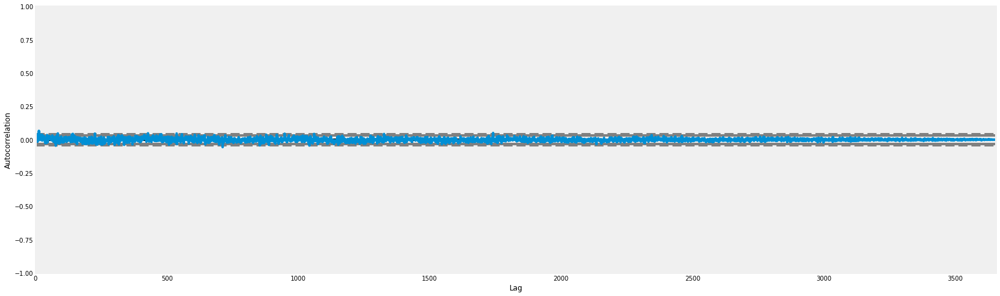

In [162]:
#checking randomness in the uberBLACK dataframe
autocorrelation_plot(UberBLACK_he['high_estimate'])

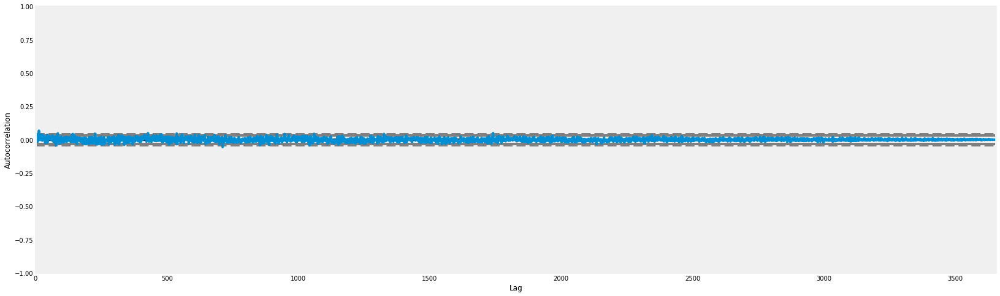

In [163]:
autocorrelation_plot(UberBLACK_he['low_estimate'])

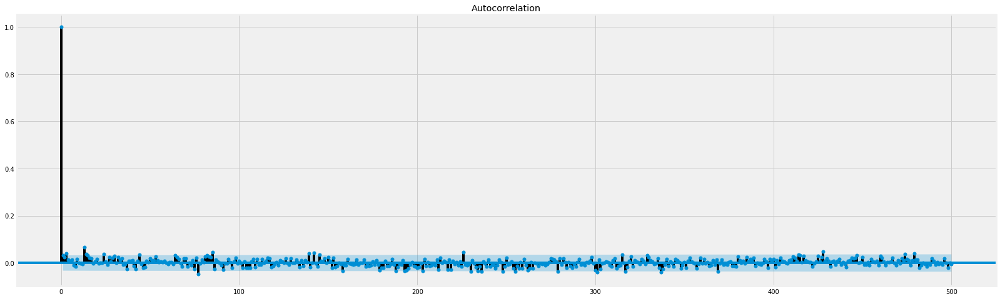

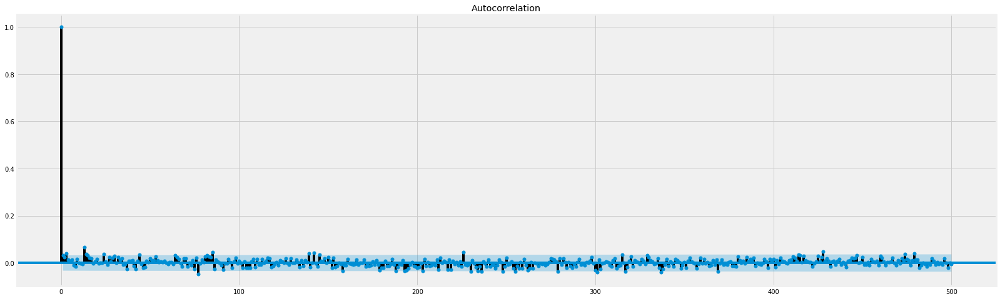

In [164]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(UberBLACK_he['high_estimate'], lags=500)

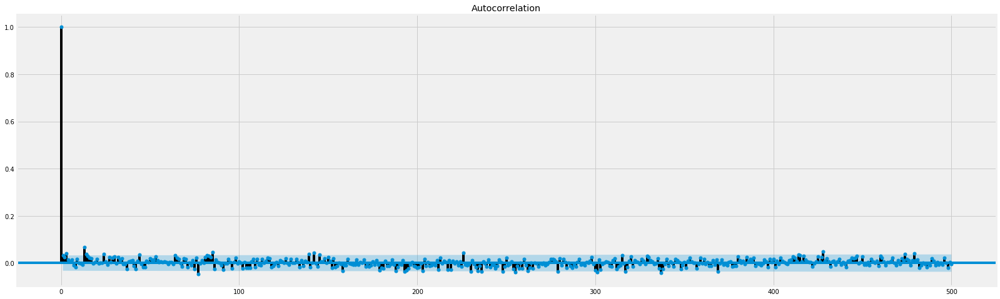

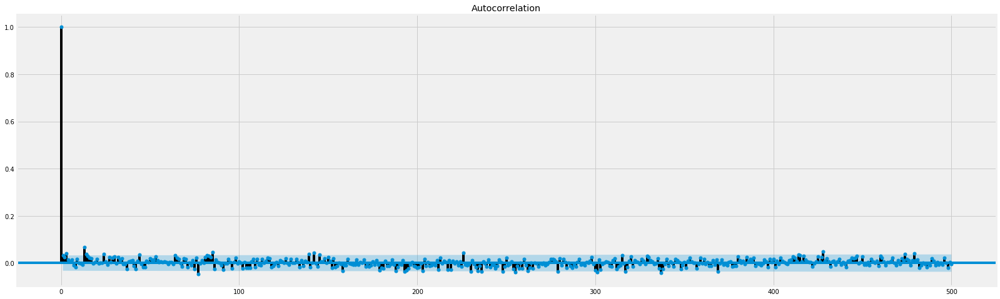

In [165]:
plot_acf(UberBLACK_he['low_estimate'], lags=500)

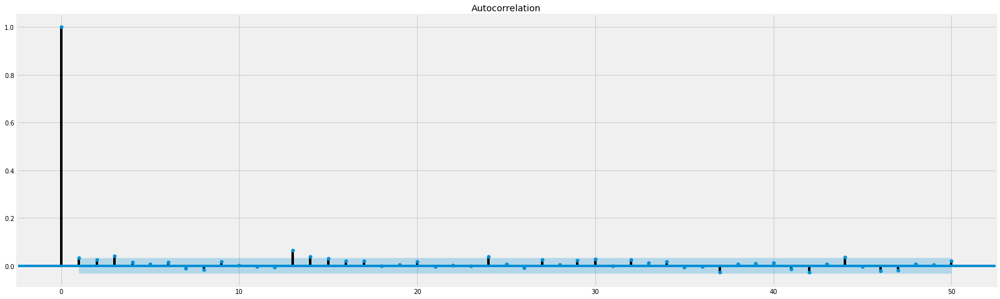

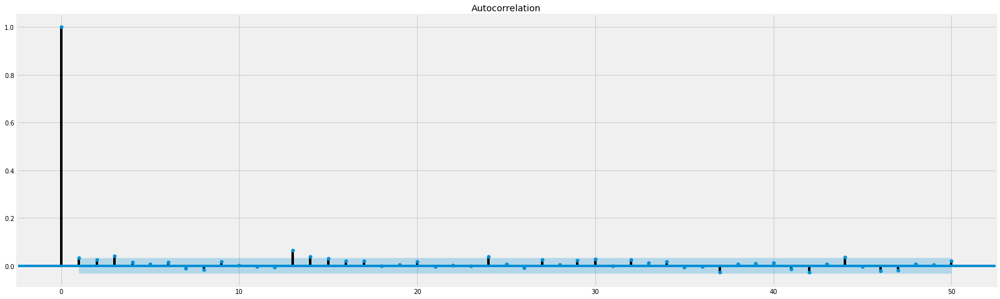

In [166]:
plot_acf(UberBLACK_he['high_estimate'], lags=50)

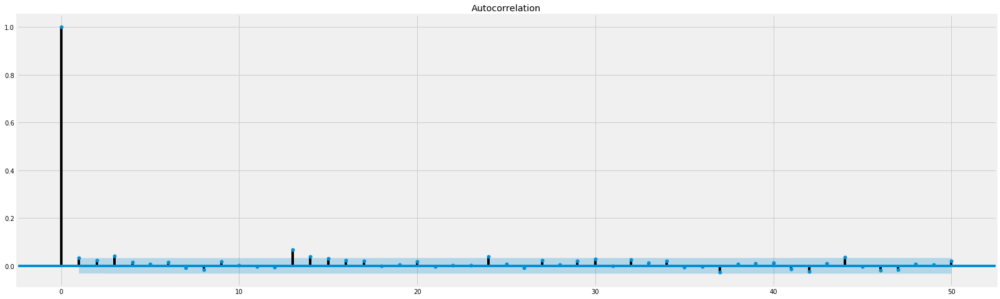

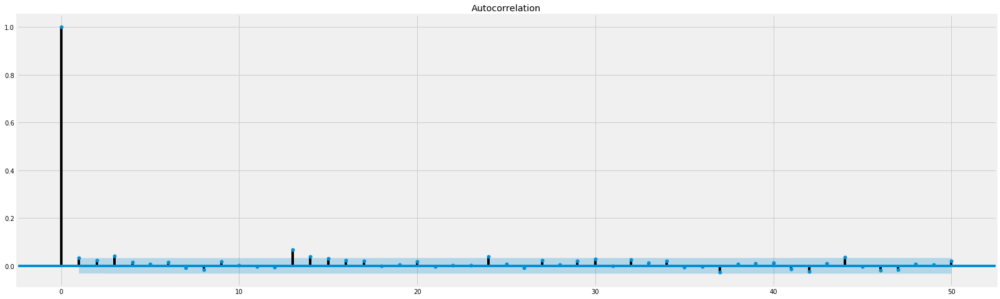

In [167]:
plot_acf(UberBLACK_he['low_estimate'], lags=50)

In [168]:
#resampling to hourly
UberBLACK_he = UberBLACK_he.resample('H').mean()

In [169]:
UberBLACK_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [170]:
UberBLACK_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,42.20,33.60
2017-12-05 23:00:00,43.05,34.35
2017-12-06 00:00:00,38.95,31.05
2017-12-06 01:00:00,46.60,37.40
2017-12-06 02:00:00,41.60,33.00


In [171]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [172]:
mod = sm.tsa.ARIMA(UberBLACK_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:1056.5799726984878


In [173]:
mod = sm.tsa.ARIMA(UberBLACK_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:981.8491611081707


In [174]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(UberBLACK_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:1056.5799726984878
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:1052.4514481667513
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1144.7321099289084
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:1057.5826702610339
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:1052.9242352272943
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:1052.6239173221036
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1114.6149416282722
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:1054.9137178474257


In [175]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(UberBLACK_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:981.8491611081707
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:977.6747393190481
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:1070.174124074736
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:983.2508833043735
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:978.1217888009691
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:977.9198342763734
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:1039.8772114791338
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:980.533330319134


In [176]:
UberBLACK_he['ln_high_estimate'] = np.log(UberBLACK_he['high_estimate'])
UberBLACK_he['D.ln_high_estimate'] = UberBLACK_he['ln_high_estimate'].diff()

In [177]:
UberBLACK_he['ln_low_estimate'] = np.log(UberBLACK_he['low_estimate'])
UberBLACK_he['D.ln_low_estimate'] = UberBLACK_he['ln_low_estimate'].diff()

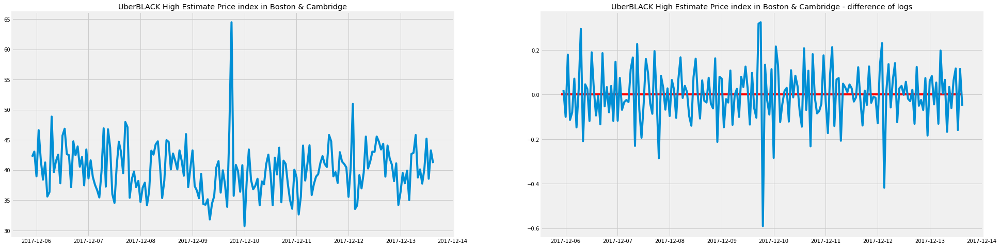

In [178]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(UberBLACK_he.index._mpl_repr(), UberBLACK_he['high_estimate'], '-')
axes[0].set(title='UberBLACK High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(UberBLACK_he.index._mpl_repr(), UberBLACK_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, UberBLACK_he.index[0], UberBLACK_he.index[-1], 'r')
axes[1].set(title='UberBLACK High Estimate Price index in Boston & Cambridge - difference of logs');

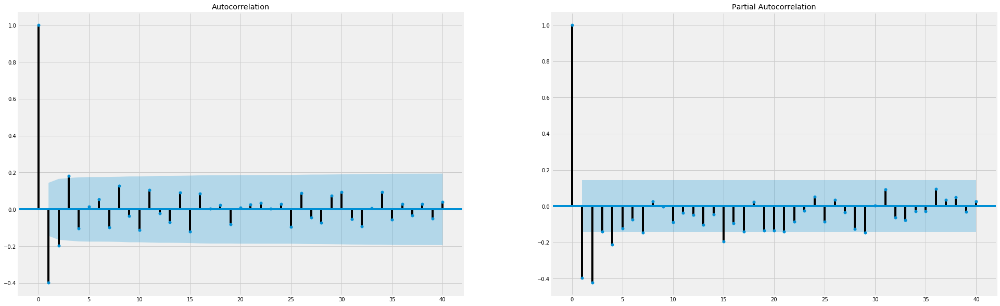

In [179]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(UberBLACK_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(UberBLACK_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

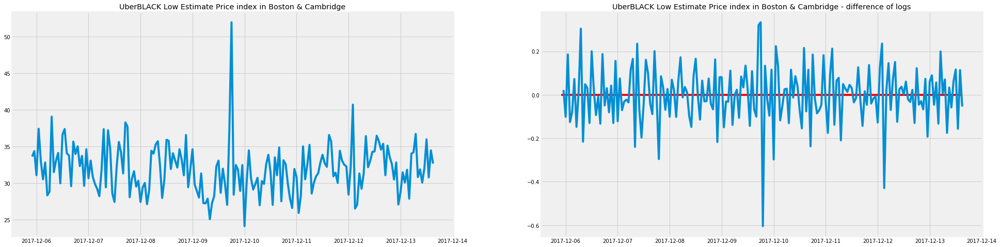

In [180]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(UberBLACK_he.index._mpl_repr(), UberBLACK_he['low_estimate'], '-')
axes[0].set(title='UberBLACK Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(UberBLACK_he.index._mpl_repr(), UberBLACK_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, UberBLACK_he.index[0], UberBLACK_he.index[-1], 'r')
axes[1].set(title='UberBLACK Low Estimate Price index in Boston & Cambridge - difference of logs');

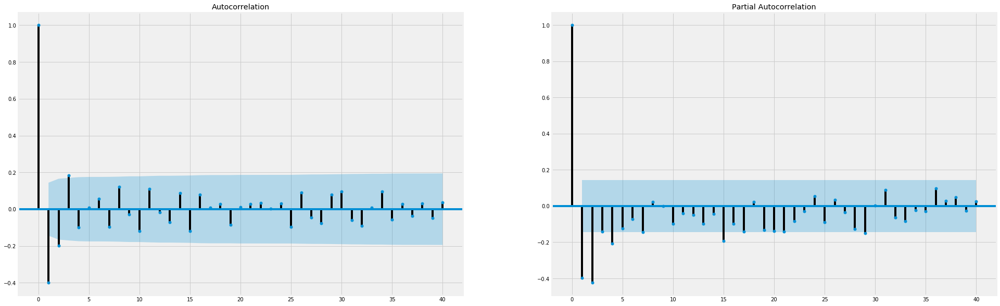

In [181]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(UberBLACK_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(UberBLACK_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [182]:
mod = sm.tsa.statespace.SARIMAX(UberBLACK_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 166.142
Date:                Sat, 16 Dec 2017   AIC                           -324.284
Time:                        01:55:39   BIC                           -311.381
Sample:                    12-05-2017   HQIC                          -319.056
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -7.281e-05      0.000     -0.237      0.812      -0.001       0.001
ar.L1          0.1726      0.060      2.862      0.004       0.054       0.291
ma.L1         -0.9699      0.024    -40.505      0.000      -1.017      -0.923
sigma2         0.0096      0.001     11.530      0.000       0.008       0.011
===================================================================================
Ljung-Box (Q):                       44.69   Jarque-Bera (JB):                36.69
Prob(Q):                              0.28   Prob(JB):                         0.00
Heteroskedasticity (H):               0.85   Skew:                             0.49
Prob(H) (two-sided):                  0.52   Kurtosis:                         4.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [183]:
mod = sm.tsa.statespace.SARIMAX(UberBLACK_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 161.181
Date:                Sat, 16 Dec 2017   AIC                           -314.361
Time:                        01:55:40   BIC                           -301.458
Sample:                    12-05-2017   HQIC                          -309.132
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -7.157e-05      0.000     -0.225      0.822      -0.001       0.001
ar.L1          0.1738      0.061      2.871      0.004       0.055       0.293
ma.L1         -0.9695      0.024    -40.292      0.000      -1.017      -0.922
sigma2         0.0101      0.001     11.576      0.000       0.008       0.012
===================================================================================
Ljung-Box (Q):                       45.07   Jarque-Bera (JB):                36.24
Prob(Q):                              0.27   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                             0.47
Prob(H) (two-sided):                  0.49   Kurtosis:                         4.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [184]:
# Variables
endog = UberBLACK_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(UberBLACK_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -418.218
Date:                Sat, 16 Dec 2017   AIC                            846.436
Time:                        01:55:40   BIC                            862.511
Sample:                    12-06-2017   HQIC                           852.951
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 40.0918      0.409     98.123      0.000      39.291      40.893
D.ln_high_estimate    21.0229      0.877     23.963      0.000      19.303      22.742
ar.L1                  0.1048      0.076      1.383      0.167      -0.044       0.253
ma.L1                  0.8116      0.063     12.942      0.000       0.689       0.934
sigma2                 5.4804      0.299     18.333      0.000       4.895       6.066
===================================================================================
Ljung-Box (Q):                       41.81   Jarque-Bera (JB):               619.93
Prob(Q):                              0.39   Prob(JB):                         0.00
Heteroskedasticity (H):               0.83   Skew:                             1.49
Prob(H) (two-sided):                  0.48   Kurtosis:                        11.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

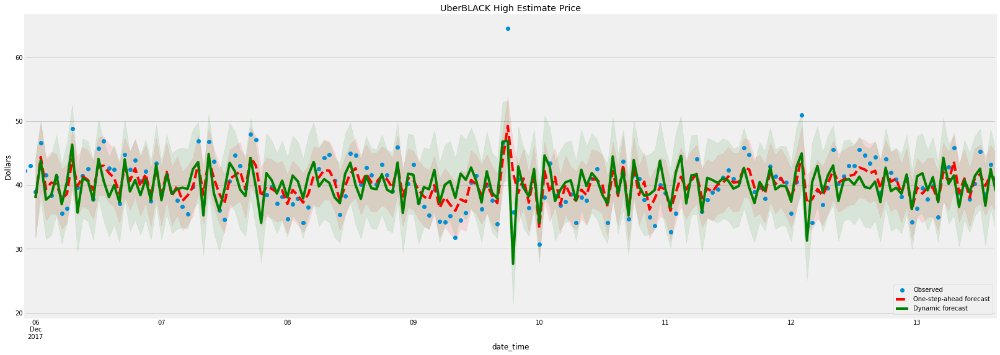

In [185]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='UberBLACK High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
UberBLACK_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

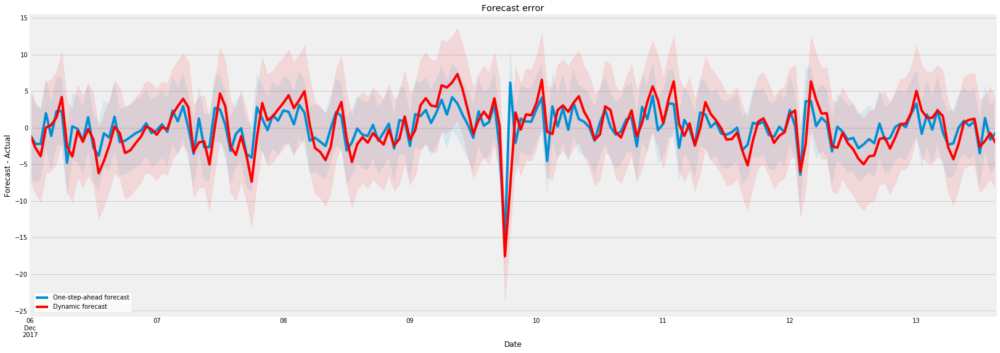

In [186]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [187]:
# Variables
endog = UberBLACK_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(UberBLACK_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -381.571
Date:                Sat, 16 Dec 2017   AIC                            773.141
Time:                        01:55:41   BIC                            789.216
Sample:                    12-06-2017   HQIC                           779.657
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                31.9042      0.335     95.231      0.000      31.248      32.561
D.ln_low_estimate    16.7064      0.704     23.717      0.000      15.326      18.087
ar.L1                 0.1084      0.077      1.414      0.157      -0.042       0.259
ma.L1                 0.8059      0.064     12.641      0.000       0.681       0.931
sigma2                3.6802      0.201     18.314      0.000       3.286       4.074
===================================================================================
Ljung-Box (Q):                       42.15   Jarque-Bera (JB):               635.38
Prob(Q):                              0.38   Prob(JB):                         0.00
Heteroskedasticity (H):               0.82   Skew:                             1.49
Prob(H) (two-sided):                  0.45   Kurtosis:                        11.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

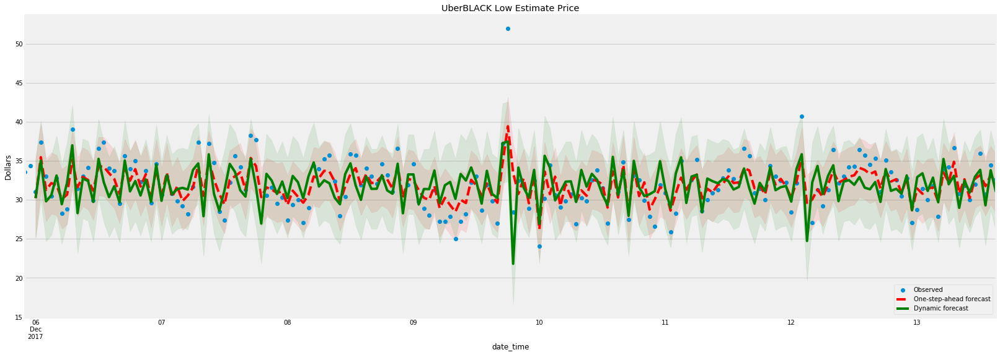

In [188]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='UberBLACK Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
UberBLACK_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

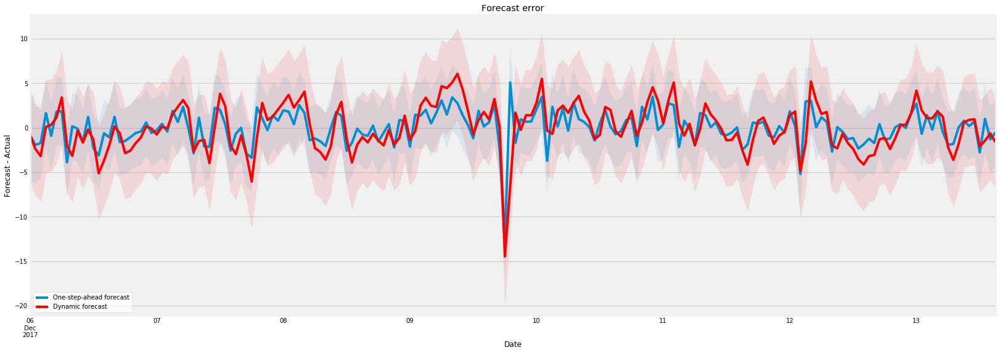

In [189]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

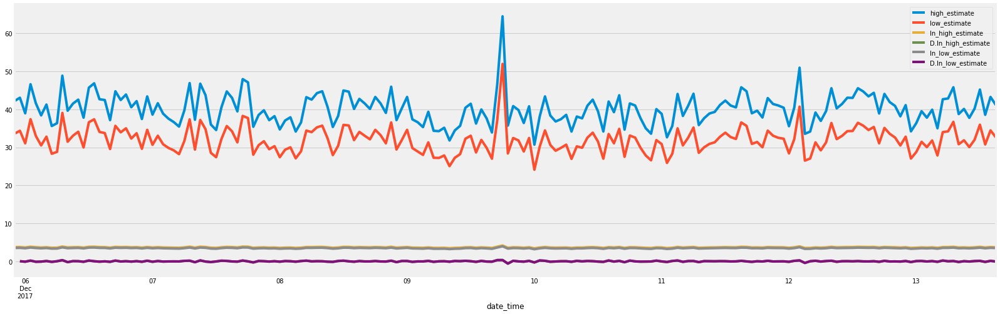

In [190]:
UberBLACK_he.plot()

# uberWAV

In [191]:
uberWAV = uber[uber.display_name == 'uberWAV']
uberWAV.head()

,date_time,currency_code,display_name,distance,duration,end_latitude,end_longitude,estimate,high_estimate,localized_display_name,low_estimate,product_id,start_latitude,start_longitude,time
date_time,,,,,,,,,,,,,,,
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberWAV,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberWAV,18.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:47:56
2017-12-05 22:48:00,2017-12-05 22:47:56,USD,uberWAV,8.24,1080,42.314857,-71.056782,$18-23,23.0,uberWAV,18.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:47:56
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberWAV,6.18,1140,42.272678,-71.093765,$15-19,19.0,uberWAV,15.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:48:51
2017-12-05 22:49:00,2017-12-05 22:48:51,USD,uberWAV,6.18,1140,42.272678,-71.093765,$15-19,19.0,uberWAV,15.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:48:51
2017-12-05 22:52:00,2017-12-05 22:51:50,USD,uberWAV,8.53,1320,42.247948,-71.173050,$20-25,25.0,uberWAV,20.0,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,42.342588,-71.122463,22:51:50


In [192]:
uberWAV_col_list = ['high_estimate', 'low_estimate']
uberWAV_he = uberWAV[uberWAV_col_list]
uberWAV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,23.0,18.0
2017-12-05 22:48:00,23.0,18.0
2017-12-05 22:49:00,19.0,15.0
2017-12-05 22:49:00,19.0,15.0
2017-12-05 22:52:00,25.0,20.0


In [193]:
#remove duplicated datetimeindex
uberWAV_he = uberWAV_he[~uberWAV_he.index.duplicated(keep = 'first')]
uberWAV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:48:00,23.0,18.0
2017-12-05 22:49:00,19.0,15.0
2017-12-05 22:52:00,25.0,20.0
2017-12-05 22:55:00,14.0,10.0
2017-12-05 22:58:00,15.0,12.0


In [194]:
print(min(uberWAV_he.index))
print(max(uberWAV_he.index))

2017-12-05 22:48:00
2017-12-13 15:39:00


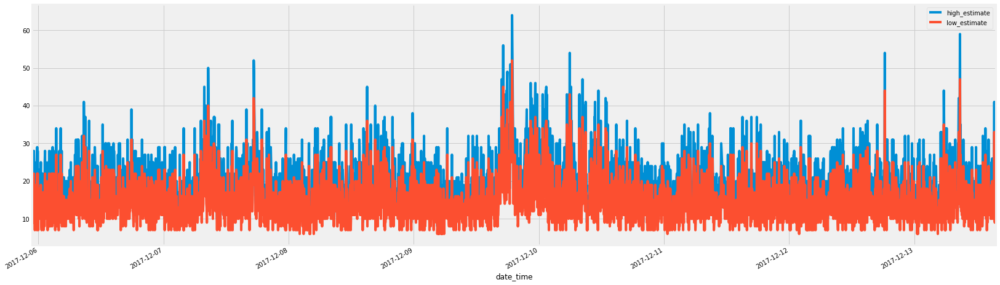

In [195]:
uberWAV_he.plot()

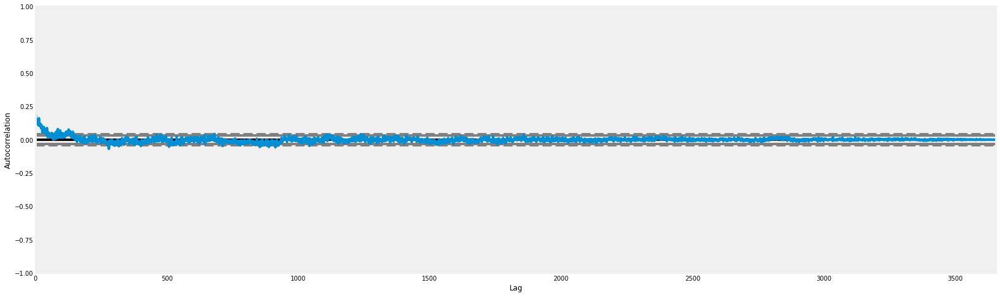

In [196]:
#checking randomness in the uberWAV dataframe
autocorrelation_plot(uberWAV_he['high_estimate'])

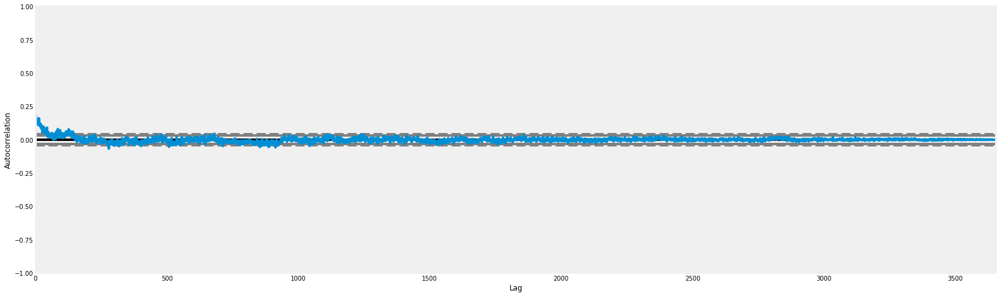

In [197]:
autocorrelation_plot(uberWAV_he['low_estimate'])

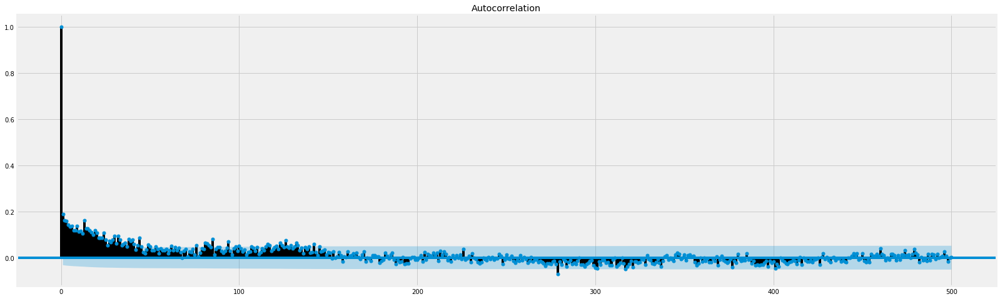

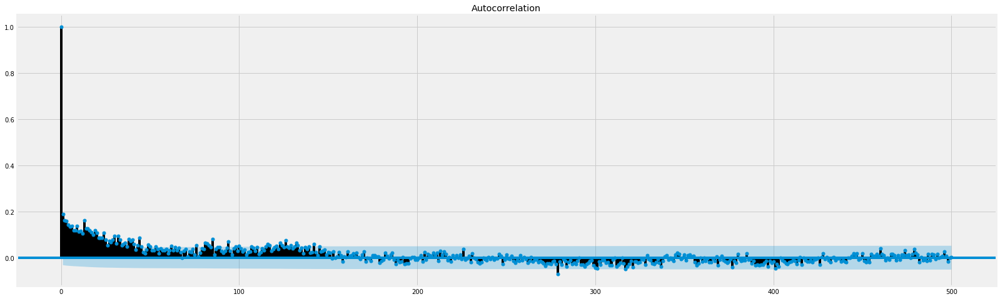

In [198]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(uberWAV_he['high_estimate'], lags=500)

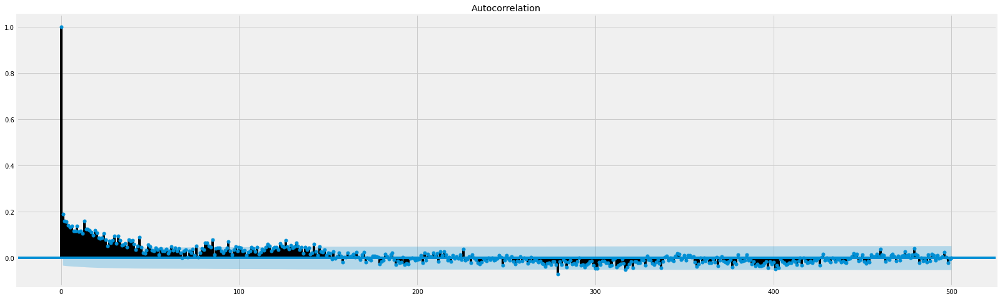

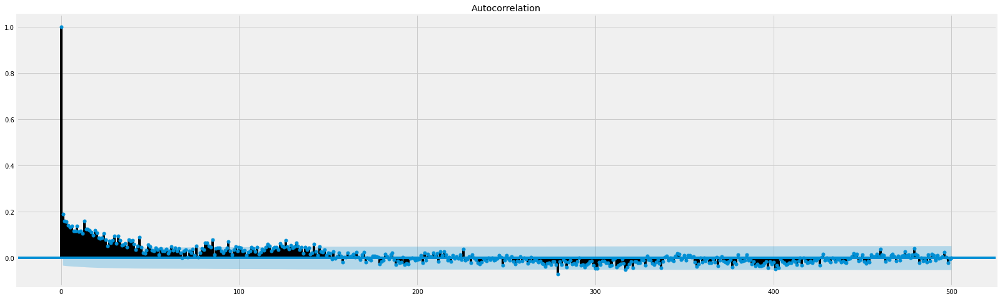

In [199]:
plot_acf(uberWAV_he['low_estimate'], lags=500)

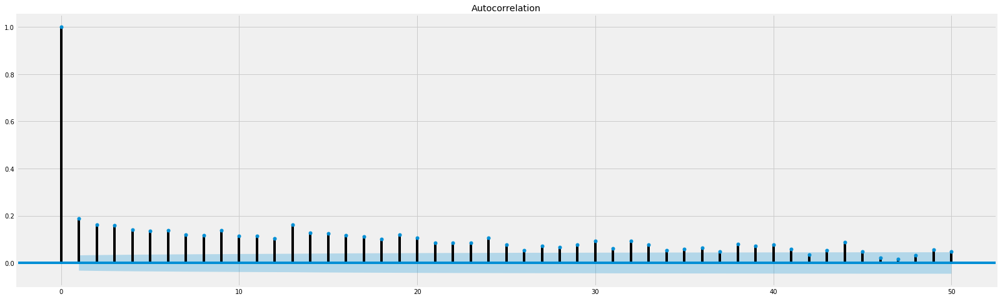

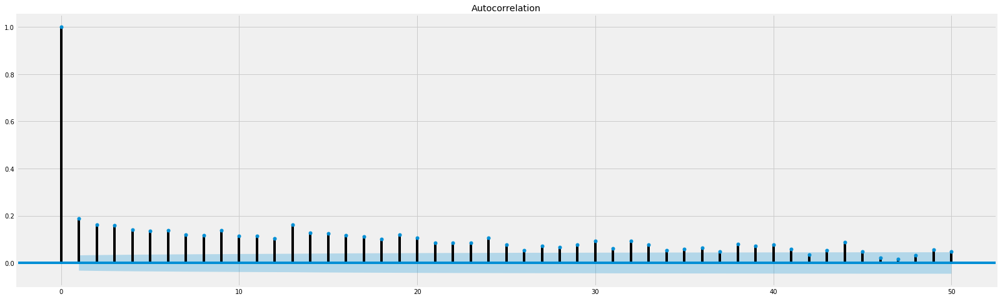

In [200]:
plot_acf(uberWAV_he['high_estimate'], lags=50)

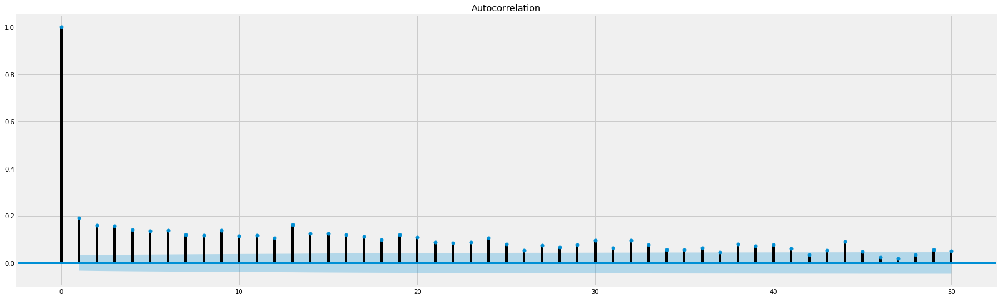

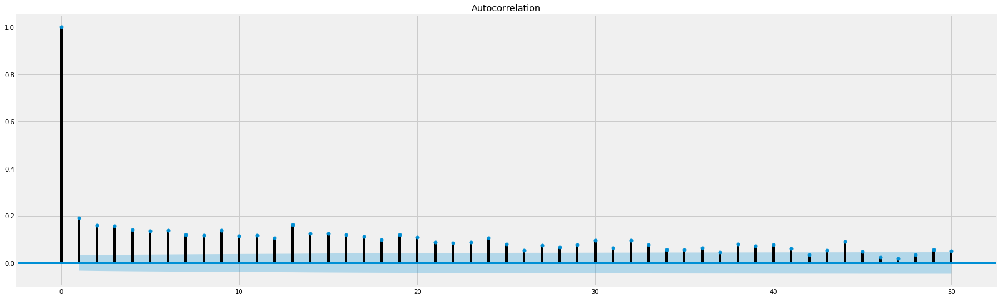

In [201]:
plot_acf(uberWAV_he['low_estimate'], lags=50)

In [202]:
#resampling to hourly
uberWAV_he = uberWAV_he.resample('H').mean()

In [203]:
uberWAV_he.index

DatetimeIndex(['2017-12-05 22:00:00', '2017-12-05 23:00:00',
               '2017-12-06 00:00:00', '2017-12-06 01:00:00',
               '2017-12-06 02:00:00', '2017-12-06 03:00:00',
               '2017-12-06 04:00:00', '2017-12-06 05:00:00',
               '2017-12-06 06:00:00', '2017-12-06 07:00:00',
               ...
               '2017-12-13 06:00:00', '2017-12-13 07:00:00',
               '2017-12-13 08:00:00', '2017-12-13 09:00:00',
               '2017-12-13 10:00:00', '2017-12-13 11:00:00',
               '2017-12-13 12:00:00', '2017-12-13 13:00:00',
               '2017-12-13 14:00:00', '2017-12-13 15:00:00'],
              dtype='datetime64[ns]', name='date_time', length=186, freq='H')

In [204]:
uberWAV_he.head()

,high_estimate,low_estimate
date_time,,
2017-12-05 22:00:00,19.20,15.00
2017-12-05 23:00:00,19.05,14.50
2017-12-06 00:00:00,17.65,13.60
2017-12-06 01:00:00,19.40,14.95
2017-12-06 02:00:00,17.50,13.40


In [205]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [206]:
mod = sm.tsa.ARIMA(uberWAV_he['high_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:938.8374509444583


In [207]:
mod = sm.tsa.ARIMA(uberWAV_he['low_estimate'], order=pdq[0])
results = mod.fit()
print('ARIMA{} - AIC:{}'.format(pdq[0], results.aic))

ARIMA(0, 0, 0) - AIC:864.578622617231


In [208]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberWAV_he['high_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:938.8374509444583
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:887.1674964131046
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:912.8857711907045
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:898.0915176258882
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:872.4983787705163
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:874.3368186744389
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:907.4195579177845
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:874.4238889394383


In [209]:
for param in pdq:
    print('Trying ARIMA{}'.format(param))       
    try:
        mod = sm.tsa.ARIMA(uberWAV_he['low_estimate'],
                                        order=param)

        results = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results.aic))
    except:
        continue

Trying ARIMA(0, 0, 0)
ARIMA(0, 0, 0) - AIC:864.578622617231
Trying ARIMA(0, 0, 1)
ARIMA(0, 0, 1) - AIC:812.4723932298958
Trying ARIMA(0, 1, 0)
ARIMA(0, 1, 0) - AIC:837.826462077639
Trying ARIMA(0, 1, 1)
ARIMA(0, 1, 1) - AIC:823.3161982303322
Trying ARIMA(1, 0, 0)
ARIMA(1, 0, 0) - AIC:797.4051778223939
Trying ARIMA(1, 0, 1)
ARIMA(1, 0, 1) - AIC:799.2446974022334
Trying ARIMA(1, 1, 0)
ARIMA(1, 1, 0) - AIC:832.4726965855102
Trying ARIMA(1, 1, 1)
ARIMA(1, 1, 1) - AIC:799.7280909569874


In [210]:
uberWAV_he['ln_high_estimate'] = np.log(uberWAV_he['high_estimate'])
uberWAV_he['D.ln_high_estimate'] = uberWAV_he['ln_high_estimate'].diff()

In [211]:
uberWAV_he['ln_low_estimate'] = np.log(uberWAV_he['low_estimate'])
uberWAV_he['D.ln_low_estimate'] = uberWAV_he['ln_low_estimate'].diff()

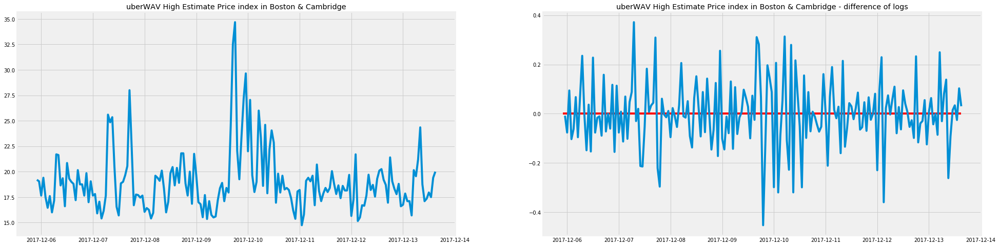

In [212]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberWAV_he.index._mpl_repr(), uberWAV_he['high_estimate'], '-')
axes[0].set(title='uberWAV High Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberWAV_he.index._mpl_repr(), uberWAV_he['D.ln_high_estimate'], '-')
axes[1].hlines(0, uberWAV_he.index[0], uberWAV_he.index[-1], 'r')
axes[1].set(title='uberWAV High Estimate Price index in Boston & Cambridge - difference of logs');

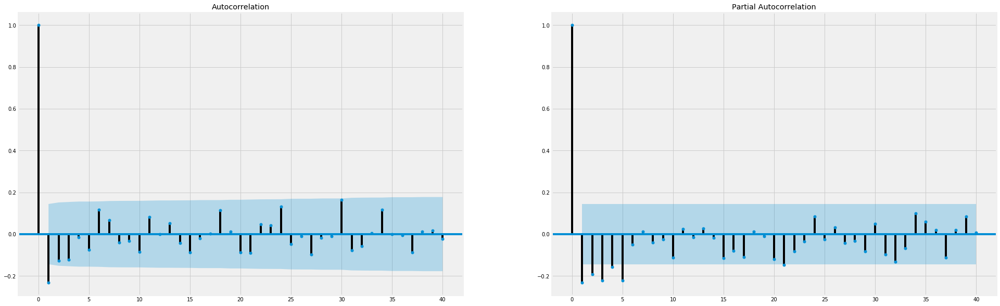

In [213]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberWAV_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberWAV_he.ix[1:, 'D.ln_high_estimate'], lags=40, ax=axes[1])

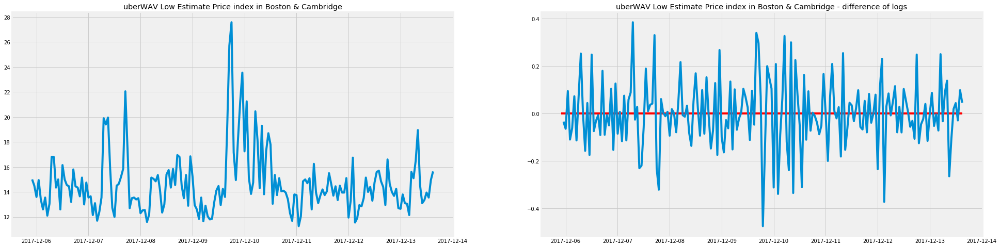

In [214]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30,8))

# Levels
axes[0].plot(uberWAV_he.index._mpl_repr(), uberWAV_he['low_estimate'], '-')
axes[0].set(title='uberWAV Low Estimate Price index in Boston & Cambridge')

# Log difference
axes[1].plot(uberWAV_he.index._mpl_repr(), uberWAV_he['D.ln_low_estimate'], '-')
axes[1].hlines(0, uberWAV_he.index[0], uberWAV_he.index[-1], 'r')
axes[1].set(title='uberWAV Low Estimate Price index in Boston & Cambridge - difference of logs');

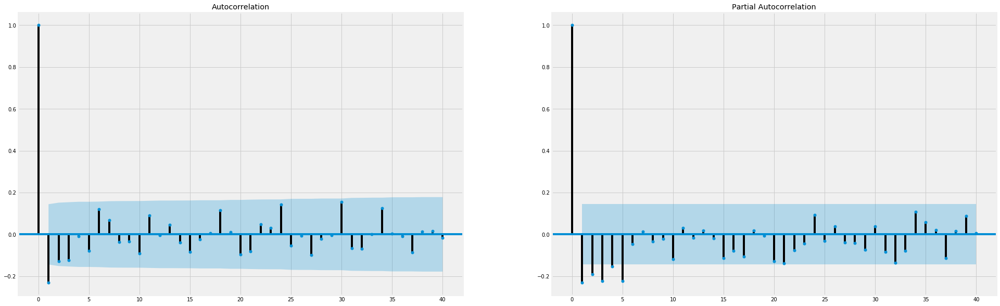

In [215]:
# Graph data
fig, axes = plt.subplots(1, 2, figsize=(30, 10))

fig = sm.graphics.tsa.plot_acf(uberWAV_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(uberWAV_he.ix[1:, 'D.ln_low_estimate'], lags=40, ax=axes[1])

In [216]:
mod = sm.tsa.statespace.SARIMAX(uberWAV_he['ln_high_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:       ln_high_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 130.081
Date:                Sat, 16 Dec 2017   AIC                           -252.162
Time:                        01:55:48   BIC                           -239.259
Sample:                    12-05-2017   HQIC                          -246.933
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -2.39e-05      0.000     -0.089      0.929      -0.001       0.001
ar.L1          0.5452      0.051     10.692      0.000       0.445       0.645
ma.L1         -0.9853      0.024    -40.457      0.000      -1.033      -0.938
sigma2         0.0142      0.001     10.632      0.000       0.012       0.017
===================================================================================
Ljung-Box (Q):                       35.35   Jarque-Bera (JB):                26.96
Prob(Q):                              0.68   Prob(JB):                         0.00
Heteroskedasticity (H):               0.69   Skew:                             0.78
Prob(H) (two-sided):                  0.15   Kurtosis:                         4.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [217]:
mod = sm.tsa.statespace.SARIMAX(uberWAV_he['ln_low_estimate'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:        ln_low_estimate   No. Observations:                  186
Model:               SARIMAX(1, 1, 1)   Log Likelihood                 120.550
Date:                Sat, 16 Dec 2017   AIC                           -233.099
Time:                        01:55:49   BIC                           -220.196
Sample:                    12-05-2017   HQIC                          -227.871
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2.096e-05      0.000     -0.081      0.935      -0.001       0.000
ar.L1          0.5510      0.051     10.901      0.000       0.452       0.650
ma.L1         -0.9893      0.029    -33.720      0.000      -1.047      -0.932
sigma2         0.0157      0.002     10.370      0.000       0.013       0.019
===================================================================================
Ljung-Box (Q):                       36.18   Jarque-Bera (JB):                27.30
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):               0.69   Skew:                             0.80
Prob(H) (two-sided):                  0.15   Kurtosis:                         4.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [218]:
# Variables
endog = uberWAV_he.ix['2017-12-06':, 'high_estimate']
exog = sm.add_constant(uberWAV_he.ix['2017-12-06':, 'D.ln_high_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:          high_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -321.512
Date:                Sat, 16 Dec 2017   AIC                            653.023
Time:                        01:55:49   BIC                            669.098
Sample:                    12-06-2017   HQIC                           659.538
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 19.0043      0.557     34.103      0.000      17.912      20.096
D.ln_high_estimate     9.9622      0.224     44.516      0.000       9.524      10.401
ar.L1                  0.5381      0.049     10.914      0.000       0.442       0.635
ma.L1                  0.8407      0.039     21.449      0.000       0.764       0.918
sigma2                 1.9045      0.133     14.372      0.000       1.645       2.164
===================================================================================
Ljung-Box (Q):                       34.99   Jarque-Bera (JB):               258.56
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               0.67   Skew:                             1.54
Prob(H) (two-sided):                  0.12   Kurtosis:                         7.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

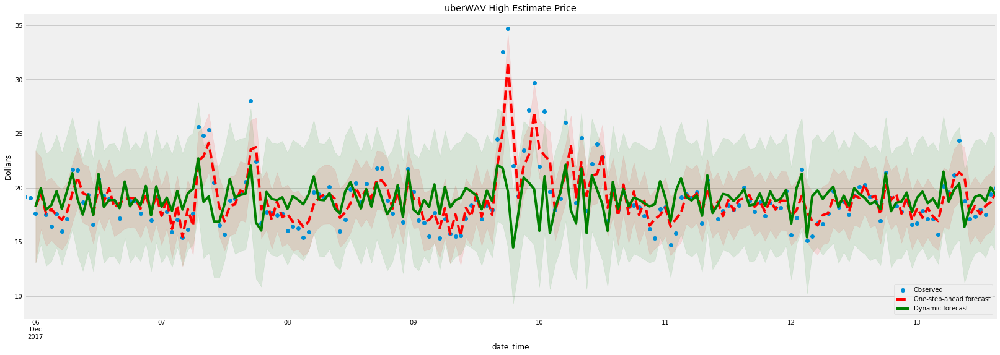

In [219]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberWAV High Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberWAV_he.ix['2017-12-05':, 'high_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

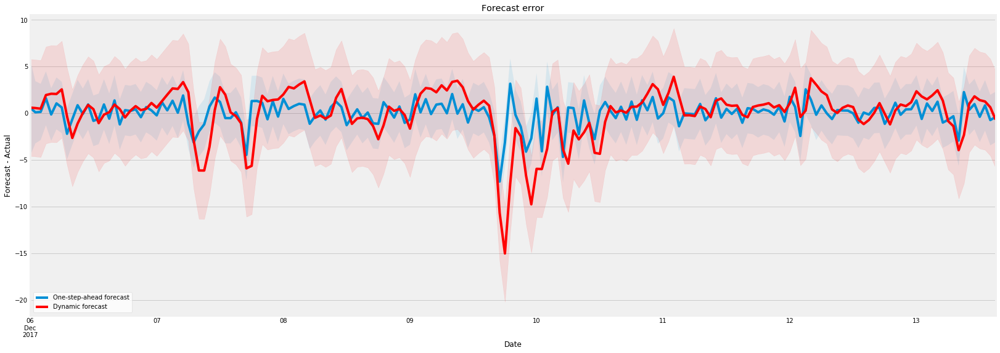

In [220]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

In [221]:
# Variables
endog = uberWAV_he.ix['2017-12-06':, 'low_estimate']
exog = sm.add_constant(uberWAV_he.ix['2017-12-06':, 'D.ln_low_estimate'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.ix[:'2017-12-13'], exog=exog.ix[:'2017-12-13'], order=(1,0,1))
fit_res = mod.fit(disp=False)
fit_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:           low_estimate   No. Observations:                  184
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -285.976
Date:                Sat, 16 Dec 2017   AIC                            581.952
Time:                        01:55:50   BIC                            598.027
Sample:                    12-06-2017   HQIC                           588.467
                         - 12-13-2017                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                14.6527      0.462     31.723      0.000      13.747      15.558
D.ln_low_estimate     7.7272      0.178     43.400      0.000       7.378       8.076
ar.L1                 0.5408      0.049     11.045      0.000       0.445       0.637
ma.L1                 0.8250      0.040     20.449      0.000       0.746       0.904
sigma2                1.2949      0.088     14.683      0.000       1.122       1.468
===================================================================================
Ljung-Box (Q):                       35.31   Jarque-Bera (JB):               287.81
Prob(Q):                              0.68   Prob(JB):                         0.00
Heteroskedasticity (H):               0.65   Skew:                             1.59
Prob(H) (two-sided):                  0.10   Kurtosis:                         8.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

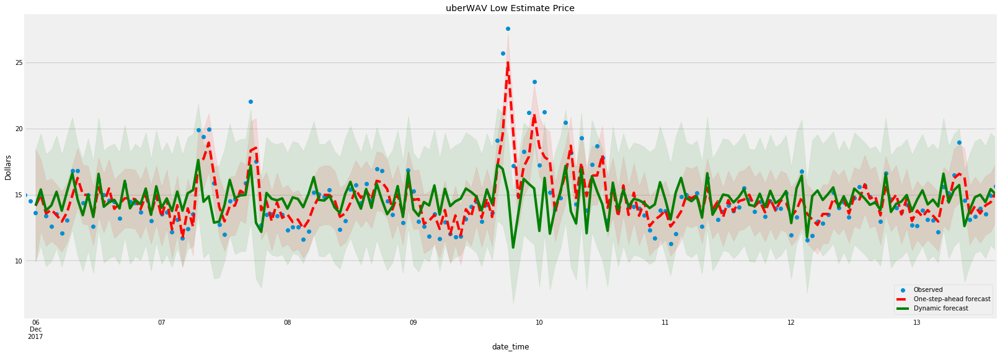

In [222]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='2017-12-06')
predict_dy_ci = predict_dy.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(25,9))
npre = 4
ax.set(title='uberWAV Low Estimate Price', xlabel='Date', ylabel='Dollars')

# Plot data points
uberWAV_he.ix['2017-12-05':, 'low_estimate'].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='r--', label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)
predict_dy.predicted_mean.ix['2017-12-05':].plot(ax=ax, style='g', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='g', alpha=0.1)

legend = ax.legend(loc='lower right')

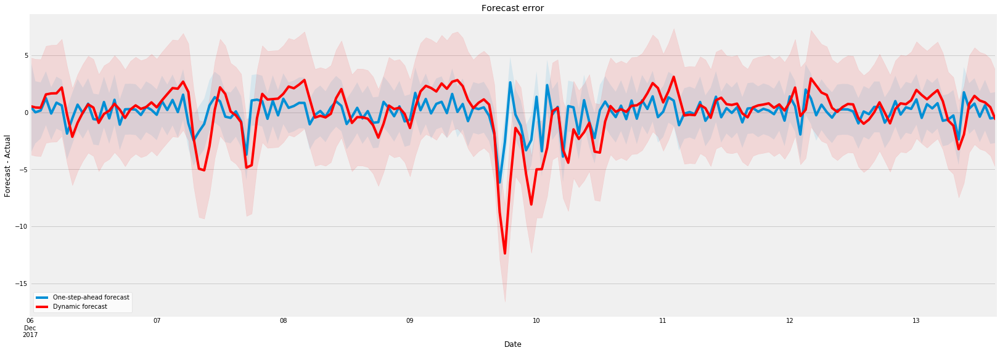

In [223]:
# Prediction error

# Graph
fig, ax = plt.subplots(figsize=(25, 9))
npre = 4
ax.set(title='Forecast error', xlabel='Date', ylabel='Forecast - Actual')

# In-sample one-step-ahead predictions and 95% confidence intervals
predict_error = predict.predicted_mean - endog
predict_error.ix['2017-12-05':].plot(ax=ax, label='One-step-ahead forecast')
ci = predict_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], alpha=0.1)

# Dynamic predictions and 95% confidence intervals
predict_dy_error = predict_dy.predicted_mean - endog
predict_dy_error.ix['2017-12-05':].plot(ax=ax, style='r', label='Dynamic forecast')
ci = predict_dy_ci.ix['2017-12-05':].copy()
ci.iloc[:,0] -= endog.loc['2017-12-05':]
ci.iloc[:,1] -= endog.loc['2017-12-05':]
ax.fill_between(ci.index, ci.ix[:,0], ci.ix[:,1], color='r', alpha=0.1)

legend = ax.legend(loc='lower left');
legend.get_frame().set_facecolor('w')

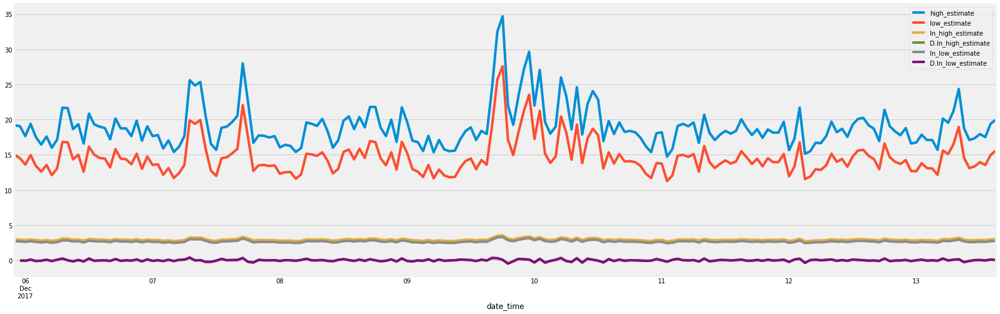

In [224]:
uberWAV_he.plot()